In [6]:
import pandas as pd
import numpy as np
import seaborn as sb

import datetime as dt
import re

import matplotlib.pyplot as plt
from matplotlib import cm

import folium
from folium.plugins import MarkerCluster

---
# Data Cleaning

We have just imported the raw data, the first step we should do is to clean the data so that it is usable to us

In [7]:
accident_df = pd.read_csv('US_Accidents_March23_sampled_500k.csv')

In [8]:
accident_df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2047758,Source2,2,2019-06-12 10:10:56,2019-06-12 10:55:58,30.641211,-91.153481,NaN,NaN,0.000,...,False,False,False,False,True,False,Day,Day,Day,Day
1,A-4694324,Source1,2,2022-12-03 23:37:14.000000000,2022-12-04 01:56:53.000000000,38.990562,-77.399070,38.990037,-77.398282,0.056,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-5006183,Source1,2,2022-08-20 13:13:00.000000000,2022-08-20 15:22:45.000000000,34.661189,-120.492822,34.661189,-120.492442,0.022,...,False,False,False,False,True,False,Day,Day,Day,Day
3,A-4237356,Source1,2,2022-02-21 17:43:04,2022-02-21 19:43:23,43.680592,-92.993317,43.680574,-92.972223,1.054,...,False,False,False,False,False,False,Day,Day,Day,Day
4,A-6690583,Source1,2,2020-12-04 01:46:00,2020-12-04 04:13:09,35.395484,-118.985176,35.395476,-118.985995,0.046,...,False,False,False,False,False,False,Night,Night,Night,Night


In [9]:
accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 46 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ID                     500000 non-null  object 
 1   Source                 500000 non-null  object 
 2   Severity               500000 non-null  int64  
 3   Start_Time             500000 non-null  object 
 4   End_Time               500000 non-null  object 
 5   Start_Lat              500000 non-null  float64
 6   Start_Lng              500000 non-null  float64
 7   End_Lat                279623 non-null  float64
 8   End_Lng                279623 non-null  float64
 9   Distance(mi)           500000 non-null  float64
 10  Description            499999 non-null  object 
 11  Street                 499309 non-null  object 
 12  City                   499981 non-null  object 
 13  County                 500000 non-null  object 
 14  State                  500000 non-nu

In [10]:
accident_df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,500000.000000,500000.000000,500000.000000,279623.000000,279623.000000,500000.000000,489534.000000,370983.000000,488870.000000,491072.000000,488709.000000,463013.000000,357384.000000
mean,2.212748,36.206421,-94.736583,36.273192,-95.776553,0.564317,61.646254,58.229028,64.834921,29.536621,9.091540,7.681347,0.008289
std,0.486661,5.071411,17.405761,5.265333,18.120211,1.774872,19.000133,22.352246,22.826158,1.008666,2.708083,5.431361,0.101865
min,1.000000,24.562117,-124.497420,24.570110,-124.497419,0.000000,-77.800000,-53.200000,1.000000,0.120000,0.000000,0.000000,0.000000
25%,2.000000,33.416823,-117.233047,33.474773,-117.778324,0.000000,49.000000,43.000000,48.000000,29.370000,10.000000,4.600000,0.000000
50%,2.000000,35.832147,-87.794365,36.192669,-88.039013,0.029000,64.000000,62.000000,67.000000,29.860000,10.000000,7.000000,0.000000
75%,2.000000,40.082443,-80.359601,40.181341,-80.252449,0.465000,76.000000,75.000000,84.000000,30.030000,10.000000,10.400000,0.000000
max,4.000000,48.999569,-67.484130,48.998901,-67.484130,193.479996,207.000000,207.000000,100.000000,38.440000,130.000000,822.800000,10.130000


## Reducing data points

Our group has chosen a dataset with 500,000 data points, which is quite a lot. In order to reduce our data, we decided to use the data from the state with the most accident

In [11]:
# find state with most accidents
print("Number of states:", len(accident_df['State'].unique()))
print(accident_df['State'].value_counts())

Number of states: 49
State
CA    113274
FL     56710
TX     37355
SC     24737
NY     22594
NC     21750
VA     19515
PA     19351
MN     12333
OR     11559
AZ     11150
GA     11079
IL     10904
TN     10850
MI     10518
LA      9651
MD      9128
NJ      9020
OH      7678
WA      7004
AL      6585
UT      6310
CO      5924
OK      5296
MO      5025
CT      4602
IN      4320
MA      3917
WI      2290
KY      2101
NE      1893
MT      1871
IA      1724
AR      1483
KS      1362
NV      1343
DC      1207
RI      1093
MS       977
DE       907
WV       851
ID       718
NM       636
NH       635
WY       254
ND       238
ME       202
VT        57
SD        19
Name: count, dtype: int64


C:\Users\fazli\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


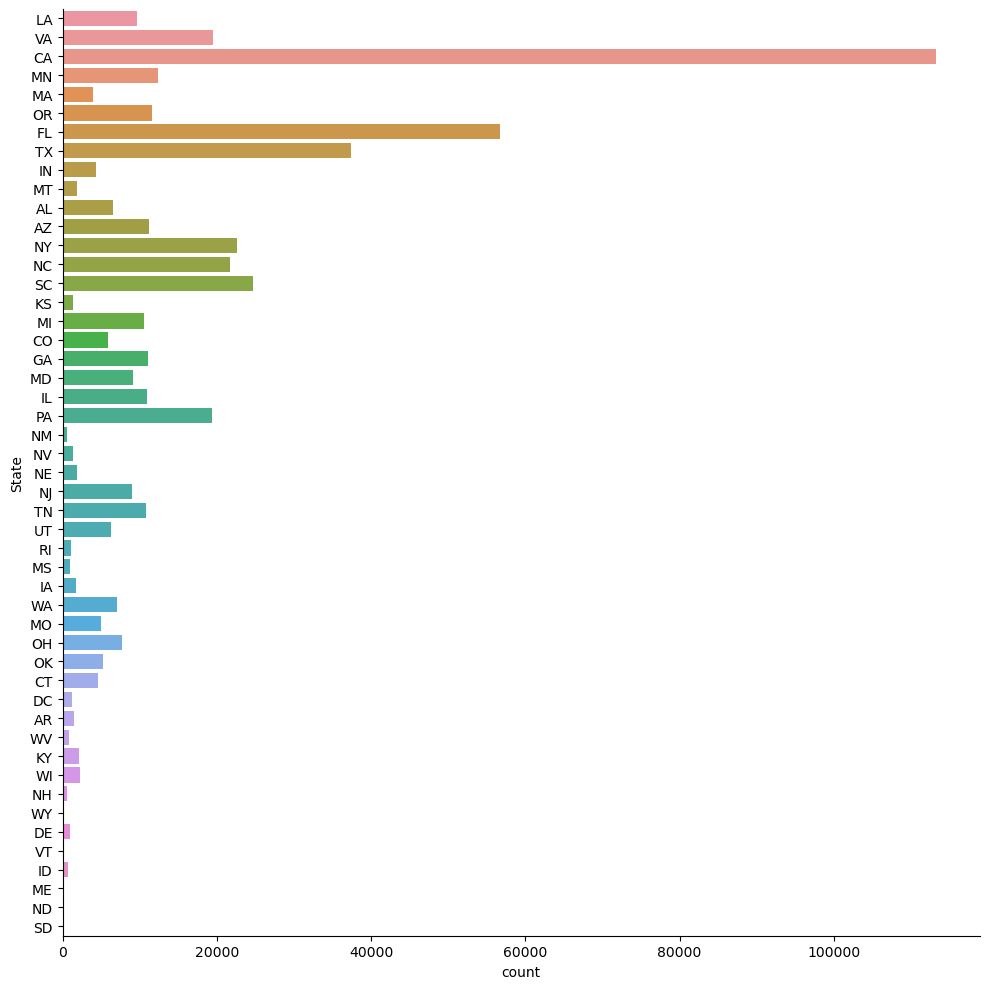

In [12]:
# plot graph
sb.catplot(y = 'State', data = accident_df, kind = 'count', height = 10)

From above, we can see that California `CA` has the most amount of accidents (113274). Thus, we can remove all the other rows that are not from `CA`. However, California still has over 100000 data points. We want to further reduce this to 10000 by taking random sample

In [13]:
# keep rows from California state
cal_accident_df = accident_df[accident_df['State'] == 'CA']

In [14]:
# before doing random sample, we remove rows that contain null values
# let us see the amount of null values in each col
cal_accident_df.isnull().sum()

ID                           0
Source                       0
Severity                     0
Start_Time                   0
End_Time                     0
Start_Lat                    0
Start_Lng                    0
End_Lat                  41490
End_Lng                  41490
Distance(mi)                 0
Description                  0
Street                     161
City                         0
County                       0
State                        0
Zipcode                     38
Country                      0
Timezone                    38
Airport_Code               130
Weather_Timestamp         2037
Temperature(F)            2892
Wind_Chill(F)            32964
Humidity(%)               3054
Pressure(in)              2305
Visibility(mi)            2531
Wind_Direction            2911
Wind_Speed(mph)          10505
Precipitation(in)        36561
Weather_Condition         2521
Amenity                      0
Bump                         0
Crossing                     0
Give_Way

In [15]:
# drop rows with null values
cal_accident_df = cal_accident_df.dropna()
cal_accident_df.isnull().sum()

ID                       0
Source                   0
Severity                 0
Start_Time               0
End_Time                 0
Start_Lat                0
Start_Lng                0
End_Lat                  0
End_Lng                  0
Distance(mi)             0
Description              0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Country                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Wind_Chill(F)            0
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          0
Precipitation(in)        0
Weather_Condition        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
S

In [16]:
# Now, we can take a random sample
cal_accident_df = cal_accident_df.sample(30000)

In [17]:
cal_accident_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30000 entries, 437735 to 81595
Data columns (total 46 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     30000 non-null  object 
 1   Source                 30000 non-null  object 
 2   Severity               30000 non-null  int64  
 3   Start_Time             30000 non-null  object 
 4   End_Time               30000 non-null  object 
 5   Start_Lat              30000 non-null  float64
 6   Start_Lng              30000 non-null  float64
 7   End_Lat                30000 non-null  float64
 8   End_Lng                30000 non-null  float64
 9   Distance(mi)           30000 non-null  float64
 10  Description            30000 non-null  object 
 11  Street                 30000 non-null  object 
 12  City                   30000 non-null  object 
 13  County                 30000 non-null  object 
 14  State                  30000 non-null  object 
 15  Zi

In [18]:
# after removing the rows, we now need to reindex the dataframe
cal_accident_df = cal_accident_df.reset_index(drop=True)

In [19]:
cal_accident_df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-7290123,Source1,2,2019-12-26 05:07:00,2019-12-26 11:50:29,34.029792,-117.712334,34.029792,-117.712334,0.000,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-4169727,Source1,2,2022-11-05 22:05:00,2022-11-05 23:26:59,32.790735,-117.206966,32.790654,-117.207464,0.029,...,False,False,False,False,True,False,Night,Night,Night,Night
2,A-4534295,Source1,2,2022-05-11 17:13:21,2022-05-11 17:41:12,33.559599,-117.672096,33.558857,-117.674384,0.141,...,False,False,False,False,True,False,Day,Day,Day,Day
3,A-7409368,Source1,2,2019-09-05 17:02:00,2019-09-05 17:34:18,34.744805,-120.514829,34.744805,-120.514829,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
4,A-6961931,Source1,2,2020-12-09 03:50:00,2020-12-09 06:41:24,33.982067,-118.252066,33.982051,-118.251175,0.051,...,False,True,False,False,True,False,Night,Night,Night,Night


In [20]:
cal_accident_df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,2.017233,35.649492,-119.446616,35.649644,-119.446223,0.767286,63.022503,62.700753,57.822400,29.483420,9.035699,6.119893,0.003571
std,0.206408,2.143587,1.919237,2.143942,1.919244,1.727393,14.198354,14.737913,24.702719,0.919002,2.645086,5.468810,0.023816
min,1.000000,32.564200,-124.300653,32.564200,-124.307438,0.000000,1.000000,-2.000000,2.000000,19.360000,0.000000,0.000000,0.000000
25%,2.000000,33.960140,-121.409166,33.960009,-121.409000,0.025000,53.000000,53.000000,38.000000,29.380000,10.000000,0.000000,0.000000
50%,2.000000,34.262439,-118.463635,34.263671,-118.466767,0.190000,62.000000,62.000000,60.000000,29.780000,10.000000,6.000000,0.000000
75%,2.000000,37.711098,-117.915221,37.712364,-117.911873,0.805000,72.000000,72.000000,78.000000,29.940000,10.000000,9.000000,0.000000
max,4.000000,42.000100,-114.377093,42.003262,-114.374317,49.346000,114.000000,114.000000,100.000000,30.520000,100.000000,142.000000,0.800000


## Columns of dataset

**ID**: This is a unique identifier of the accident record.

**Source**: Source of raw accident data

**Severity**: Shows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay).

**Start_Time**: Shows start time of the accident in local time zone.

**End_Time**: Shows end time of the accident in local time zone. End time here refers to when the impact of accident on traffic flow was dismissed.

**Start_Lat**: Shows latitude in GPS coordinate of the start point.

**Start_Lng**: Shows longitude in GPS coordinate of the start point.

**End_Lat**: Shows latitude in GPS coordinate of the end point.

**End_Lng**: Shows longitude in GPS coordinate of the end point.

**Distance**(mi): The length of the road extent affected by the accident in miles.

**Description**: Shows a human provided description of the accident.

**Street**: Shows the street name in address field.

**City**: Shows the city in address field.

**County**: Shows the county in address field.

**State**: Shows the state in address field.

**Zipcode**: Shows the zipcode in address field.

**Country**: Shows the country in address field.

**Timezone**: Shows timezone based on the location of the accident (eastern, central, etc.).

**Airport_Code**: Denotes an airport-based weather station which is the closest one to location of the accident.

**Weather_Timestamp**: Shows the time-stamp of weather observation record (in local time).

**Temperature**(F): Shows the temperature (in Fahrenheit).

**Wind_Chill**(F): Shows the wind chill (in Fahrenheit).

**Humidity**(%): Shows the humidity (in percentage).

**Pressure**(in): Shows the air pressure (in inches).

**Visibility**(mi): Shows visibility (in miles).

**Wind_Direction**: Shows wind direction.

**Wind_Speed**(mph): Shows wind speed (in miles per hour).

**Precipitation**(in): Shows precipitation amount in inches, if there is any.

**Weather_Condition**: Shows the weather condition (rain, snow, thunderstorm, fog, etc.)

**Amenity**: A POI annotation which indicates presence of amenity in a nearby location.

**Bump**: A POI annotation which indicates presence of speed bump or hump in a nearby location.

**Crossing**: A POI annotation which indicates presence of crossing in a nearby location.

**Give_Way**: A POI annotation which indicates presence of give_way in a nearby location.

**Junction**: A POI annotation which indicates presence of junction in a nearby location.

**No_Exit**: A POI annotation which indicates presence of no_exit in a nearby location.

**Railway**: A POI annotation which indicates presence of railway in a nearby location.

**Roundabout**: A POI annotation which indicates presence of roundabout in a nearby location.

**Station**: A POI annotation which indicates presence of station in a nearby location.

**Stop**: A POI annotation which indicates presence of stop in a nearby location.

**Traffic_Calming**: A POI annotation which indicates presence of traffic_calming in a nearby location.

**Traffic_Signal**: A POI annotation which indicates presence of traffic_signal in a nearby location.

**Turning_Loop**: A POI annotation which indicates presence of turning_loop in a nearby location.

**Sunrise_Sunset**: Shows the period of day (i.e. day or night) based on sunrise/sunset.

**Civil_Twilight**: Shows the period of day (i.e. day or night) based on civil twilight.

**Nautical_Twilight**: Shows the period of day (i.e. day or night) based on nautical twilight.

**Astronomical_Twilight**: Shows the period of day (i.e. day or night) based on astronomical twilight.

## Removing unnecessary columns

After close inspection, we decided to remove the following cols:  
`ID`, `Source`, `End_Lat`, `End_Lng`, `End_Time`, `Description`, `State`, `Country`, `Timezone`, `Airport_Code`, `Weather_Timestamp`, `Roundabout`, `Turning_Loop`, `Civil_Twilight`, `Nautical_Twilight`, `Astronomical_Twilight`

In [21]:
# remove cols that are not necessary to us
col_remove = ['ID', 'Source', 'End_Lat', 'End_Time', 'End_Lng', 'Description', 'State', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp', 'Roundabout', 'Turning_Loop', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight']
cal_accident_df = cal_accident_df.drop(columns=col_remove, axis=1)

In [22]:
cal_accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Severity           30000 non-null  int64  
 1   Start_Time         30000 non-null  object 
 2   Start_Lat          30000 non-null  float64
 3   Start_Lng          30000 non-null  float64
 4   Distance(mi)       30000 non-null  float64
 5   Street             30000 non-null  object 
 6   City               30000 non-null  object 
 7   County             30000 non-null  object 
 8   Zipcode            30000 non-null  object 
 9   Temperature(F)     30000 non-null  float64
 10  Wind_Chill(F)      30000 non-null  float64
 11  Humidity(%)        30000 non-null  float64
 12  Pressure(in)       30000 non-null  float64
 13  Visibility(mi)     30000 non-null  float64
 14  Wind_Direction     30000 non-null  object 
 15  Wind_Speed(mph)    30000 non-null  float64
 16  Precipitation(in)  300

## Standardisation of data

### Datetime

The `Start_Time` col consists of the date and start time of accident. However, it's datatype is listed as boolean. Let's convert it as a datetime object instead. We also need to take note that the format of the col is not uniform, with some time having the millisecond and some don't   
e.g `2022-08-20 13:13:00.000000000` and `2020-12-04 01:46:00`

In [23]:
# change object type to datetime
cal_accident_df['Start_Time'] = pd.to_datetime(cal_accident_df['Start_Time'], format = 'mixed')
cal_accident_df['Start_Time'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 30000 entries, 0 to 29999
Series name: Start_Time
Non-Null Count  Dtype         
--------------  -----         
30000 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 234.5 KB


### Conversion of Units

Since the raw data is from the USA where they use empirical units, we also need to convert these data back into metric units. We can do this by adding a new column that contains the converted metric units and remove the old column conatining the empirical units

Columns to change:  
`Distance(mi)`, `Visibility(mi)`, `Wind_Speed(mph)`, `Temperature(F)`, `Wind_Chill(F)`, `Precipitation(in)`, `Pressure(in)`

In [24]:
# change imperical unit to metric unit and place them in new col

# mi -> km: Distance, Visibility
# 1 mi = 1.6 km
cal_accident_df['Distance'] = cal_accident_df['Distance(mi)'] * 1.6
cal_accident_df['Distance'] = cal_accident_df['Distance'].round(2)

cal_accident_df['Visibility'] = cal_accident_df['Visibility(mi)'] * 1.6
cal_accident_df['Visibility'] = cal_accident_df['Visibility'].round(2)

# mph -> kph: Wind_Speed
cal_accident_df['Wind_Speed'] = cal_accident_df['Wind_Speed(mph)'] * 1.6
cal_accident_df['Wind_Speed'] = cal_accident_df['Wind_Speed'].round(2)

# F -> C: Temperature, Wind_Chill
# C = (F - 32) * 5/9
def farenheit_to_celcius(f):
    return (f - 32) * 5/9

cal_accident_df['Temperature'] = cal_accident_df['Temperature(F)'].apply(farenheit_to_celcius)
cal_accident_df['Temperature'] = cal_accident_df['Temperature'].round(2)

cal_accident_df['Wind_Chill'] = cal_accident_df['Wind_Chill(F)'].apply(farenheit_to_celcius)
cal_accident_df['Wind_Chill'] = cal_accident_df['Wind_Chill'].round(2)

# in -> mm: Pressure, Precipitation
# 1 in = 25.4 mm
cal_accident_df['Precipitation'] = cal_accident_df['Precipitation(in)'] * 25.4
cal_accident_df['Precipitation'] = cal_accident_df['Precipitation'].round(2)

cal_accident_df['Pressure'] = cal_accident_df['Pressure(in)'] * 25.4
cal_accident_df['Pressure'] = cal_accident_df['Pressure'].round(2)

# remove the cols with the imperial unit
remove_cols = ['Distance(mi)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Temperature(F)', 'Wind_Chill(F)', 'Precipitation(in)', 'Pressure(in)']
cal_accident_df = cal_accident_df.drop(columns=remove_cols, axis=1)

In [25]:
cal_accident_df[['Distance', 'Visibility', 'Wind_Speed', 'Temperature', 'Wind_Chill', 'Precipitation', 'Pressure']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Distance       30000 non-null  float64
 1   Visibility     30000 non-null  float64
 2   Wind_Speed     30000 non-null  float64
 3   Temperature    30000 non-null  float64
 4   Wind_Chill     30000 non-null  float64
 5   Precipitation  30000 non-null  float64
 6   Pressure       30000 non-null  float64
dtypes: float64(7)
memory usage: 1.6 MB


In [26]:
cal_accident_df[['Distance', 'Visibility', 'Wind_Speed', 'Temperature', 'Wind_Chill', 'Precipitation', 'Pressure']].head()

,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure
0,0.00,9.6,16.0,6.11,2.78,7.62,739.14
1,0.05,16.0,0.0,12.22,12.22,0.00,749.81
2,0.23,16.0,9.6,19.44,19.44,0.00,763.27
3,0.00,16.0,12.8,19.44,19.44,0.00,750.57
4,0.08,16.0,0.0,12.78,12.78,0.00,758.19


### Zipcode

There are two types of ZIP codes used in the United States: 5-digit (or standard) `12345` and 9-digit (or extended) `12345-6789`.  
Let us standardise it to the standard 5-digit ZIP code. Then we can group them by their first 3 digits i.e. `123XXX`

In [27]:
cal_accident_df['Zipcode'].nunique()

8466

In [28]:
cal_accident_df['Zipcode'] = cal_accident_df['Zipcode'].str[:5].astype(int)   # standard 5-digit zipcode
cal_accident_df['Zipcode'] = cal_accident_df['Zipcode'].map(lambda x: round(x,-2))  # round to nearest hundred
cal_accident_df['Zipcode'] = cal_accident_df['Zipcode'].astype(str)
print('Number of unique zipcode:', cal_accident_df['Zipcode'].nunique())
cal_accident_df['Zipcode']

Number of unique zipcode: 60


0        91700
1        92100
2        92700
3        93400
4        90000
         ...  
29995    90700
29996    93600
29997    91000
29998    91800
29999    93700
Name: Zipcode, Length: 30000, dtype: object

### Sunrise_Sunset

The column `Sunrise_Sunset` has value `Day` or `Night`. We can change the values to boolean values with `Day = True` and `Night = False` and add this into a new column called `Sunlight`

In [29]:
mapping = {'Day': True, 'Night': False}

cal_accident_df['Sunlight'] = cal_accident_df['Sunrise_Sunset'].map(mapping).astype(bool)
cal_accident_df['Sunlight']

0        False
1        False
2         True
3         True
4        False
         ...  
29995    False
29996     True
29997    False
29998     True
29999     True
Name: Sunlight, Length: 30000, dtype: bool

### Wind_Direction

The column `Wind_Direction` provide the cardinal direction of the wind direction. We can convert it into integer type by mapping the correspoding angle of the cardinal direction

In [30]:
cal_accident_df['Wind_Direction'].value_counts()

Wind_Direction
CALM     7727
W        3060
WNW      1990
WSW      1862
S        1806
VAR      1738
NW       1578
SSW      1428
SW       1378
NNW      1187
SSE      1049
E        1045
N         963
SE        953
ESE       683
ENE       576
NE        528
NNE       446
South       2
North       1
Name: count, dtype: int64

In [31]:
cardinal_angles = {
    'North': 0,
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'South': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5,
    'CALM': -1,    # calm winds - no wind direction
    'VAR': -2,      # varying winds - cannot determine wind direction
    'Variable': -2
}

cal_accident_df['Wind_Direction'] = cal_accident_df['Wind_Direction'].map(cardinal_angles).astype(float)
cal_accident_df['Wind_Direction']

0        112.5
1         -1.0
2         -2.0
3          0.0
4         -1.0
         ...  
29995    270.0
29996    292.5
29997     -2.0
29998     -1.0
29999    315.0
Name: Wind_Direction, Length: 30000, dtype: float64

## Simplification

Given the huge amount of data that we have been given, we can simplify some of them by classifying similar data together

### Unique Values

In [32]:
cal_accident_df.nunique()

Severity                 4
Start_Time           29313
Start_Lat            26197
Start_Lng            26332
Street                8034
City                   919
County                  58
Zipcode                 60
Humidity(%)             99
Wind_Direction          18
Weather_Condition       46
Amenity                  2
Bump                     2
Crossing                 2
Give_Way                 2
Junction                 2
No_Exit                  2
Railway                  2
Station                  2
Stop                     2
Traffic_Calming          2
Traffic_Signal           2
Sunrise_Sunset           2
Distance              1325
Visibility              24
Wind_Speed              42
Temperature            104
Wind_Chill             116
Precipitation           49
Pressure               654
Sunlight                 2
dtype: int64

### Simplifying Weather_Condition

In [33]:
cal_accident_df['Weather_Condition'].unique()

array(['Rain', 'Fair', 'Partly Cloudy', 'Fog', 'Cloudy', 'Mostly Cloudy',
       'Haze', 'Shallow Fog', 'Fair / Windy', 'Light Rain / Windy',
       'Partly Cloudy / Windy', 'Light Rain', 'Heavy Rain', 'Light Snow',
       'Smoke', 'Blowing Dust / Windy', 'Thunder in the Vicinity',
       'T-Storm', 'Heavy Rain / Windy', 'Haze / Windy', 'Cloudy / Windy',
       'Mist', 'Mostly Cloudy / Windy', 'Rain / Windy', 'Heavy T-Storm',
       'Drizzle', 'Heavy Snow', 'Wintry Mix', 'Light Rain with Thunder',
       'Blowing Dust', 'Fog / Windy', 'Light Drizzle', 'Thunder',
       'Showers in the Vicinity', 'Snow', 'Patches of Fog', 'Overcast',
       'N/A Precipitation', 'Light Snow / Windy',
       'Widespread Dust / Windy', 'Heavy Snow / Windy',
       'Light Drizzle / Windy', 'Light Freezing Rain', 'Snow and Thunder',
       'T-Storm / Windy', 'Smoke / Windy'], dtype=object)

We can see that there are many values that are similar to each other e.g. `Cloudy`, `Partly Cloudy`, `Mostly Cloudy`. This values can be group together and simplify our data

In [34]:
weather_bin = {
    'Fair': ['Fair'],
    'Cloudy': ['Cloudy', 'Mostly Cloudy', 'Partly Cloudy'],
    'Rainy': ['Light Rain', 'Rain', 'Light Drizzle', 'Heavy Rain', 'Drizzle', 'Showers in the Vicinity', 'T-Storm', 'Thunder', 'Patches of Fog', 'Heavy T-Storm', 'Rain / Windy', 'Heavy Rain / Windy', 'Haze / Windy', 'Fog / Windy', 'Patches of Fog / Windy', 'Light Rain with Thunder'],
    'Snowy': ['Snowy', 'Light Snow', 'Snow', 'Light Snow / Windy', 'Snow / Windy', 'Heavy Snow'],
    'Windy': ['Windy', 'Blowing Dust / Windy', 'Fair / Windy', 'Mostly Cloudy / Windy', 'Light Rain / Windy'],
    'Foggy': ['Fog', 'Shallow Fog', 'Haze', 'Smoke']
}

def map_weather_bin(weather):
    for key, value in weather_bin.items():
        if weather in value:
            return key
    return 'Others'

cal_accident_df['Weather'] = cal_accident_df['Weather_Condition'].apply(map_weather_bin)
cal_accident_df['Weather'].value_counts()

Weather
Fair      19021
Cloudy     7258
Rainy      1588
Foggy      1534
Windy       371
Others      121
Snowy       107
Name: count, dtype: int64

### Simplifying type of roads

Given how huge America is, there are many different types of road that we can find, from interstate, freeway, highway, to street, avenue, boulevard and many more. To further add to the confusion, the roads are also divided into federal, state, cities, local and many more. In order to simplfy this, we are just going to use the classify them based on the given address suffix or prefix.

We can obtain the type of road from the street address `Street` and applying some basic regex pattern

In [35]:
cal_accident_df['Street'].nunique()

8034

With close to 4000 streets, let us simplify it into their different road type/categories

In [36]:
def classify_road_type(address):
    # regex to match road types
    patterns = {
        'Street': r'\b(?:street|st)|road|rd|way|wy|broadway|bdwy|bridge|brdg\b',            # street/road/way/bridge
        'Avenue': r'\b(?:avenue|ave)|boulevard|blvd|parkway|pkwy\b',                        # avenue/boulevard/parkway
        'Drive': r'\bdrive|dr|lane|ln|court|ct|circle|cir\b',                               # drive/lane/court/circle
        'Highway': r'\bhighway|hwy|CA-|SR-|state route|interstate|I-|US-\d+|freeway|fwy\b'  # highway/interstate/freeway
    }
    for key, pattern in patterns.items():
        if re.search(pattern, address, re.IGNORECASE):
            return key
    return 'Others'

cal_accident_df['Street'] = cal_accident_df['Street'].astype(str)  # convert to str
cal_accident_df['Road_Type'] = cal_accident_df['Street'].apply(classify_road_type)
# print(cal_accident_df['Road_Type'].unique())
print(cal_accident_df['Road_Type'].value_counts())

Road_Type
Highway    12255
Street     11244
Avenue      4617
Drive       1333
Others       551
Name: count, dtype: int64


In [37]:
cal_accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Severity           30000 non-null  int64         
 1   Start_Time         30000 non-null  datetime64[ns]
 2   Start_Lat          30000 non-null  float64       
 3   Start_Lng          30000 non-null  float64       
 4   Street             30000 non-null  object        
 5   City               30000 non-null  object        
 6   County             30000 non-null  object        
 7   Zipcode            30000 non-null  object        
 8   Humidity(%)        30000 non-null  float64       
 9   Wind_Direction     30000 non-null  float64       
 10  Weather_Condition  30000 non-null  object        
 11  Amenity            30000 non-null  bool          
 12  Bump               30000 non-null  bool          
 13  Crossing           30000 non-null  bool          
 14  Give_W

---
# Exploratory Data Analysis

Having cleaned our raw data above, we now have the appropriate data that we can work with.

Our main goal is to predict the `Severity` of the accident based on the different variables that we are given. Thus, we now want to find the relationship of the different variables with the `Severity` of the accident

## Severity


In [38]:
cal_accident_df['Severity'].describe()

count    30000.000000
mean         2.017233
std          0.206408
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: Severity, dtype: float64

Number of Severity levels: 4
Severity
1      153
2    29409
3      206
4      232
Name: count, dtype: int64


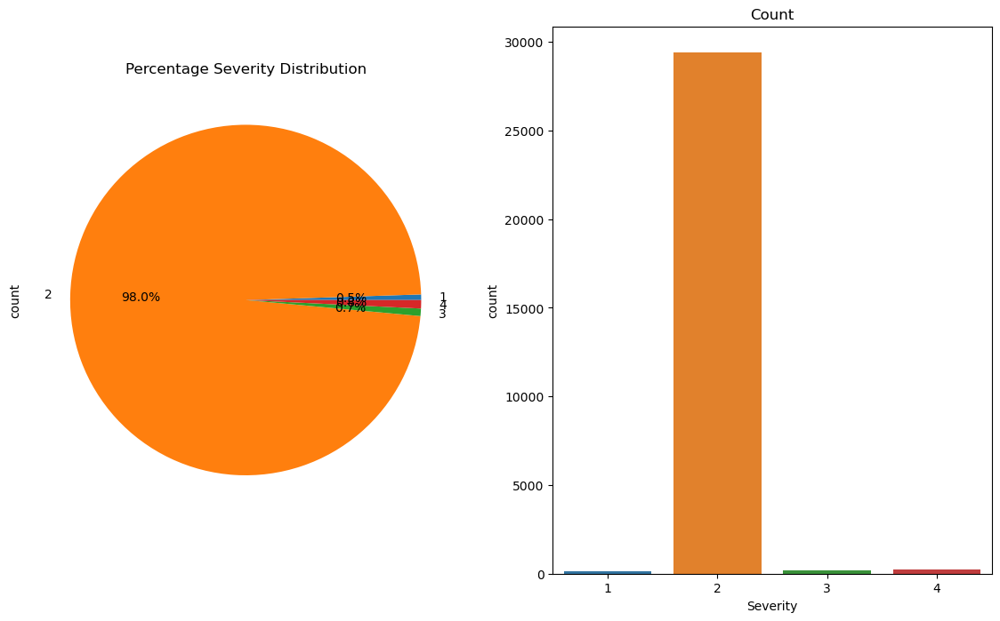

In [39]:
# print count and ratio of total count of the different severity levels
print('Number of Severity levels:', len(cal_accident_df['Severity'].unique()))
print(cal_accident_df['Severity'].value_counts().sort_index())

# plot bar and pie chart
f, axes = plt.subplots(1, 2, figsize=(14, 8))

axes[0].set_title('Percentage Severity Distribution')
cal_accident_df['Severity'].value_counts().sort_index().plot.pie(autopct = '%1.1f%%', ax = axes[0])

axes[1].set_title('Count')
sb.countplot(x = 'Severity', data = cal_accident_df, ax = axes[1])

plt.show()

## Location of accidents

Since we are given `Start_Lat` and `Start_Lng`, we can plot the coordinates on the map.  
The columns `City` and `County` also allows us to see which area has the most accidents

In [40]:
cal_accident_df[['Start_Lat', 'Start_Lng']].describe()

,Start_Lat,Start_Lng
count,30000.000000,30000.000000
mean,35.649492,-119.446616
std,2.143587,1.919237
min,32.564200,-124.300653
25%,33.960140,-121.409166
50%,34.262439,-118.463635
75%,37.711098,-117.915221
max,42.000100,-114.377093


In [41]:
def create_accident_map_with_colors(df_loc):
    """Generate a map with CircleMarkers for accident locations, colored by severity."""
    m = folium.Map(location=[36.7783, -119.4179], width="120%", height="100%", zoom_start=6)
    
    # color scheme for different severity levels 
    severity_colors = {
        1: 'purple',
        2: 'green',
        3: 'orange',
        4: 'red',
    }
    
    for index, row in df_loc.iterrows():
        lat = row['Start_Lat']
        lon = row['Start_Lng']
        severity = row['Severity']
        
        if not pd.isnull(lat) and not pd.isnull(lon) and severity in severity_colors:
            # Get color based on severity
            color = severity_colors[severity]
            
            folium.CircleMarker(
                location=[lat, lon],
                radius=1,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.6
            ).add_to(m)
    return m

create_accident_map_with_colors(cal_accident_df.sample(10000))  # sample 10000 so map don't lag

In [42]:
from folium.plugins import HeatMap

def create_heatmap(df_loc, latitude, longitude, zoom, tiles='OpenStreetMap'):
    """
    Generate a Folium Map with a heatmap of accident locations.
    """
    # Create a list of coordinates from the dataframe columns 'Start_Lat' and 'Start_Lng'
    heat_data = [[row['Start_Lat'], row['Start_Lng']] for index, row in df_loc.iterrows()]

    # Create a map centered around the specified coordinates
    world_map = folium.Map(location=[latitude, longitude], zoom_start=zoom, tiles=tiles)

    # Add the heatmap layer to the map
    HeatMap(heat_data).add_to(world_map)

    return world_map


# Create a heatmap for the entire CA using the create_heatmap function
map_CA_heatmap = create_heatmap(cal_accident_df.sample(3000), 36.7783, -119.4179, 8)

map_CA_heatmap

We can see clearly that most accidents occurs in a city such as San Fransisco or Los Angeles. This is followed by roads that are connecting cities together. This makes sense as most cities are heavily populated and thus there will be more accidents. People would also be travelling between cities and this accounts for accidents located at roads connecting cities

### Cities

In [43]:
print('Number of unique cities:', cal_accident_df['City'].nunique())

accidents_by_county = cal_accident_df.groupby(['City', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_county.insert(0, 'Total', accidents_by_county.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_county.sort_values(by=['Total'], ascending=False).head(20))   # print top 20

Number of unique cities: 919
Number of accidents in each county:
Severity        Total   1     2   3   4
City                                   
Los Angeles      2723   0  2682  28  13
San Diego        1086   0  1083   2   1
Sacramento        971   4   962   0   5
Bakersfield       564   0   554   4   6
Riverside         462   0   453   8   1
San Bernardino    442   0   435   1   6
Fresno            413   9   401   2   1
Anaheim           394   0   388   5   1
Ontario           371   0   364   7   0
Corona            331   0   326   2   3
Whittier          325   0   325   0   0
Long Beach        322   0   320   0   2
Oakland           318  11   295   6   6
San Francisco     314   7   296   5   6
San Jose          306   7   292   5   2
Stockton          246   7   236   1   2
Modesto           214   0   214   0   0
Fontana           200   0   197   2   1
Irvine            198   0   197   1   0
Hayward           197   4   190   3   0


### County

In [44]:
print('Number of unique counties:', cal_accident_df['County'].nunique())

accidents_by_county = cal_accident_df.groupby(['County', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_county.insert(0, 'Total', accidents_by_county.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_county.sort_values(by=['Total'], ascending=False))

Number of unique counties: 58
Number of accidents in each county:
Severity         Total   1     2   3   4
County                                  
Los Angeles       7887   0  7770  70  47
San Bernardino    2151   0  2117  19  15
Orange            2065   0  2040  18   7
San Diego         1969   0  1961   4   4
Riverside         1657   0  1631  18   8
Alameda           1374  36  1312  14  12
Sacramento        1358   8  1340   2   8
Kern               957   0   939   5  13
Fresno             758  12   739   2   5
Contra Costa       743  13   712   8  10
San Joaquin        703  13   681   3   6
Santa Clara        605  14   578   7   6
Ventura            445   0   441   3   1
Stanislaus         433   1   429   2   1
Sonoma             405  13   381   5   6
San Mateo          399   8   374  10   7
Tulare             375   2   349   0  24
Monterey           374   1   368   1   4
Placer             355   0   353   1   1
Merced             319   1   316   0   2
San Francisco      313   7   295

### Zipcode

In [45]:
print('Number of unique zipcode:', cal_accident_df['Zipcode'].nunique())

accidents_by_zipcode = cal_accident_df.groupby(['Zipcode', 'Severity']).size().unstack(fill_value=0)

# Summing up accidents for each county
accidents_by_zipcode.insert(0, 'Total', accidents_by_zipcode.sum(axis=1))

# Printing number of accidents in each county with total
print("Number of accidents in each county:")
print(accidents_by_zipcode.sort_values(by=['Total'], ascending=False))

Number of unique zipcode: 60
Number of accidents in each county:
Severity  Total   1     2   3   4
Zipcode                          
90000      2257   0  2219  27  11
94600      1455  40  1381  16  18
92100      1378   0  1375   2   1
95800      1055   5  1044   1   5
91700      1026   0  1013  10   3
95400       895  12   871   5   7
92600       891   0   883   6   2
93300       890   2   853   5  30
92400       779   0   766   4   9
94500       757  18   725   9   5
91800       739   0   729   8   2
92800       738   0   729   8   1
92300       709   0   699   4   6
93600       704   3   693   0   8
95700       677   2   668   1   6
91400       666   0   651  11   4
90200       661   0   649   8   4
92700       645   0   636   4   5
92500       637   0   627   9   1
95300       588   5   578   1   4
95600       578   5   564   2   7
90600       576   0   574   0   2
95100       572   7   552   7   6
93700       548  10   534   2   2
92900       532   0   522   7   3
92000       517  

We can see that the city **Los Angeles** and the county **Los Angeles** has the most accident. The zipcode **900000**, which also represents the area around **Los Angeles** also has the most accidents 

## Weather Condition

In [46]:
weather_df = cal_accident_df[['Severity', 'Weather']]
accident_by_weather = weather_df.groupby(['Weather', 'Severity']).size().unstack(fill_value=0)
accident_by_weather.insert(0, 'Total', accident_by_weather.sum(axis=1))
print(accident_by_weather)

Severity  Total   1      2    3    4
Weather                             
Cloudy     7258  62   7065   69   62
Fair      19021  77  18692  116  136
Foggy      1534   2   1512    5   15
Others      121   1    117    0    3
Rainy      1588   8   1554   12   14
Snowy       107   0    106    0    1
Windy       371   3    363    4    1


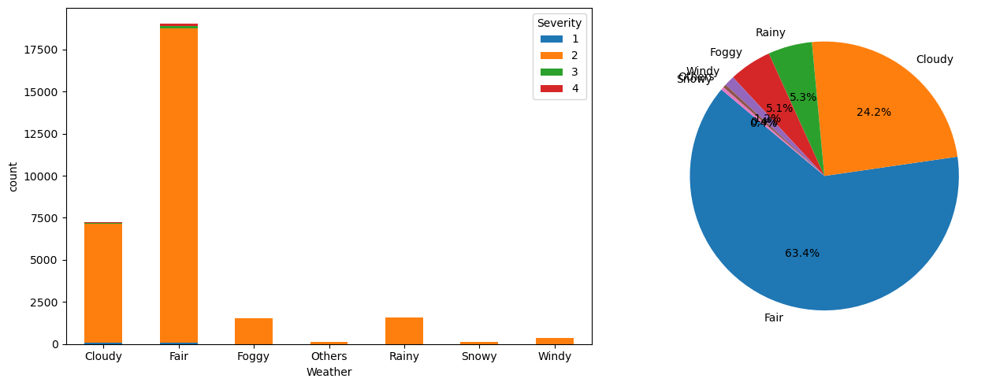

In [47]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_weather.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
weather_counts = weather_df['Weather'].value_counts()
axes[1].pie(weather_counts, labels=weather_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

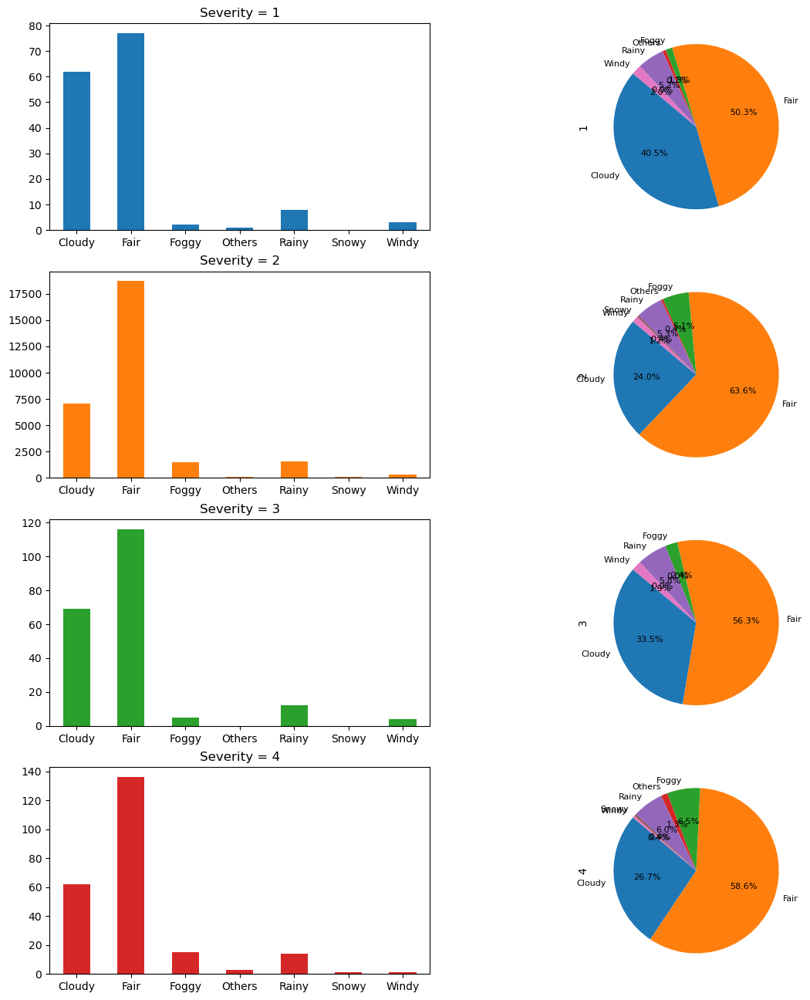

In [48]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_weather.columns:
    if col != 'Total':
        accident_by_weather[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_weather[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140,textprops={'fontsize': 8})
        i += 1

## Road Type

In [49]:
road_df = cal_accident_df[['Severity', 'Road_Type']]
accident_by_road = road_df.groupby(['Road_Type', 'Severity']).size().unstack(fill_value=0)
accident_by_road.insert(0, 'Total', accident_by_road.sum(axis=1))
print(accident_by_road)

Severity   Total   1      2    3    4
Road_Type                            
Avenue      4617  16   4553   12   36
Drive       1333   0   1324    2    7
Highway    12255  72  12001  106   76
Others       551   2    542    0    7
Street     11244  63  10989   86  106


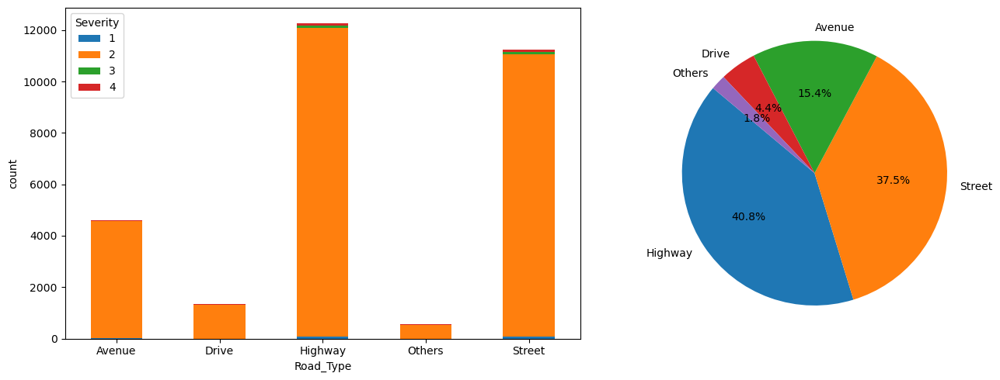

In [50]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_road.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
road_counts = road_df['Road_Type'].value_counts()
axes[1].pie(road_counts, labels=road_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

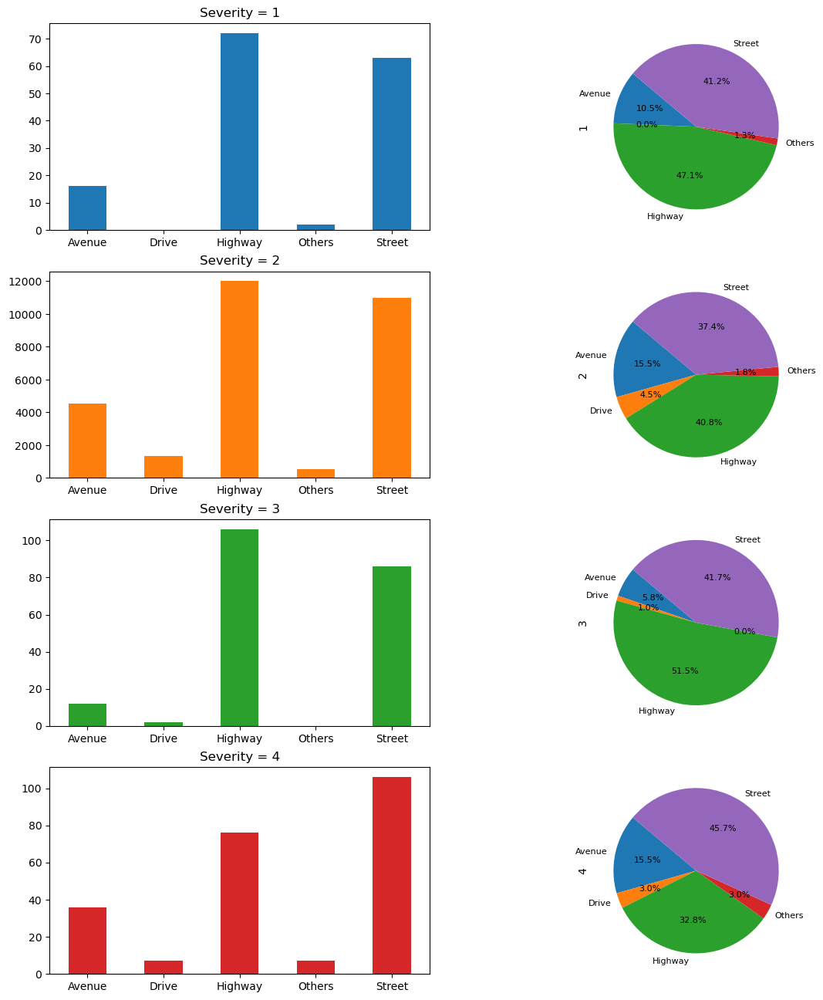

In [51]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_road.columns:
    if col != 'Total':
        accident_by_road[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_road[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140,textprops={'fontsize': 8})
        i += 1

## Date & Time of accident

The column `Start_Time` provide us with the date and time of the accident. We can break it down into `Month`, `Day` & `Hour` of accident.

In [52]:
accidents_by_month = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.month, 'Severity']).size().unstack(fill_value=0)
accidents_by_month.insert(0, 'Total', accidents_by_month.sum(axis=1))
# print(accidents_by_month.info())
print(accidents_by_month)
print('-'*36)

accidents_by_day = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.day_name(), 'Severity']).size().unstack(fill_value=0)
accidents_by_day.insert(0, 'Total', accidents_by_day.sum(axis=1))
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
accidents_by_day = accidents_by_day.reindex(day_order)
print(accidents_by_day)
print('-'*36)

accidents_by_hour = cal_accident_df.groupby([cal_accident_df['Start_Time'].dt.hour, 'Severity']).size().unstack(fill_value=0)
accidents_by_hour.insert(0, 'Total', accidents_by_hour.sum(axis=1))
print(accidents_by_hour)
print('-'*36)

Severity    Total   1     2   3   4
Start_Time                         
1            3325   0  3304   2  19
2            3137   0  3121   3  13
3            2206  25  2150  12  19
4            2234  55  2118  40  21
5            1874  43  1745  60  26
6            1926  30  1832  46  18
7            1456   0  1422   9  25
8            1715   0  1670  17  28
9            2561   0  2536   9  16
10           2546   0  2532   4  10
11           2994   0  2978   2  14
12           4026   0  4001   2  23
------------------------------------
Severity    Total   1     2   3   4
Start_Time                         
Monday       4130  24  4049  26  31
Tuesday      4505  20  4409  34  42
Wednesday    4539  11  4460  32  36
Thursday     4646  19  4556  33  38
Friday       5086  32  4974  40  40
Saturday     3888  26  3828  13  21
Sunday       3206  21  3133  28  24
------------------------------------
Severity    Total   1     2   3   4
Start_Time                         
0             709   6   68

<Axes: title={'center': 'Number of Accident by Hour'}, xlabel='Hour'>

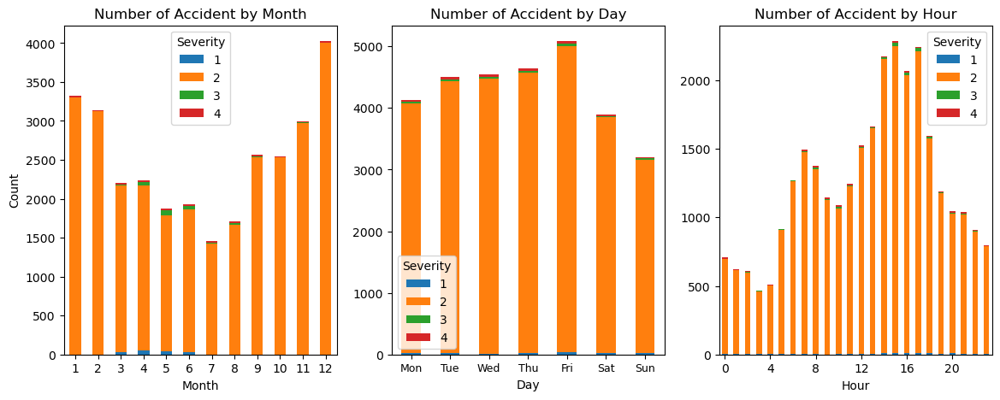

In [53]:
# Plot a stacked bar graph
f, axes = plt.subplots(1, 3, figsize=(14, 5))

# month
accidents_by_month.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[0], 
                                            title = 'Number of Accident by Month', xlabel='Month', ylabel='Count',
                                            rot=0)  # rot: rotation - ensure xlabel is not tilted

# day
accidents_by_day.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[1], 
                                            title = 'Number of Accident by Day', xlabel='Day', 
                                            rot=0)  # rot: rotation - ensure xlabel is not tilted
days_label = [day[:3] for day in day_order]
axes[1].set_xticklabels(days_label, fontsize=9)

# hour
accidents_by_hour.loc[:,[1, 2, 3, 4]].plot(kind='bar', stacked=True, ax=axes[2], 
                                            title = 'Number of Accident by Hour', xlabel='Hour', 
                                            rot=0, xticks=range(0, 24, 4))  # rot: rotation - ensure xlabel is not tilted

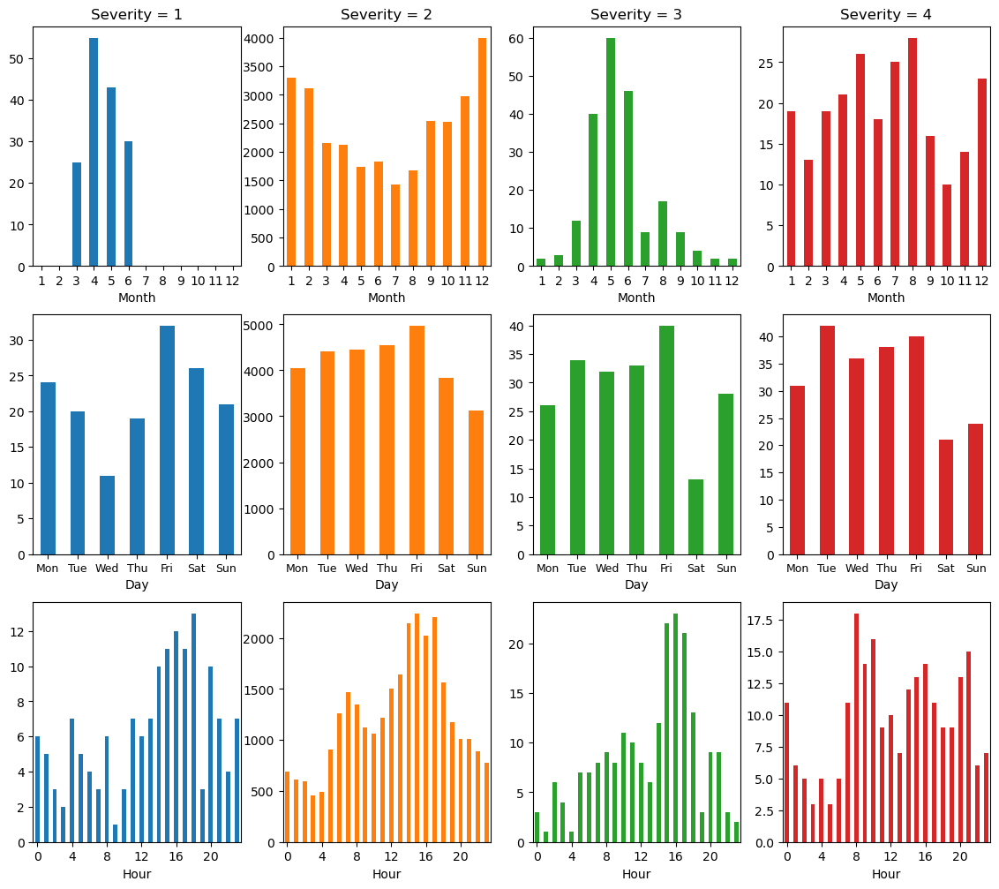

In [54]:
blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

f, axes = plt.subplots(3, 4, figsize= (14, 3*4))
i = 0

days_label = [day[:3] for day in day_order]

for column in accidents_by_month.columns:
    if column != 'Total':  # Exclude 'Total' column
        accidents_by_month[column].plot(kind='bar', title=f'Severity = {i+1}', ax=axes[0][i], xlabel='Month', color=colors[i], rot=0)
        accidents_by_day[column].plot(kind='bar', ax=axes[1][i], xlabel='Day', color=colors[i], rot=0)
        accidents_by_hour[column].plot(kind='bar', ax=axes[2][i], xlabel='Hour', color=colors[i], 
                                       rot=0, xticks=range(0, 24, 4))
        axes[1][i].set_xticklabels(days_label, fontsize=9)
        i += 1

### Adding new columns

Looking at the analysis above, we spotted a few relationship that can be used to create a new column so that we can do more accurate prediction later on

#### Is_Rush_Hour

We notice that there was a peak in accidents in the morning and evening period, which can be attributed to rush hour traffic. Hence, we decide to add the column `Is_Rush_Hour`, a boolean value to indicate whether the accident is within rush hour period

Rush_Hour period:  
`0600-1000` (morning)  
`1600-1900` (evening)

In [55]:
def is_rush_hour(start_time):
    hour = start_time.hour
    if 6 <= hour <= 10 or 16 <= hour <= 19:
        return True
    return False

cal_accident_df['Is_Rush_Hour'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_rush_hour(x) else False)

#### Is_Christmas

We notice that there was a peak in accidents in December, which can be attributed to the snowing season and also more traffic due to the christmas/holiday period. Hence, we decided to add the column `Is_Christmas`, a boolean value to indicate whether the accident occurs during the chrismtas/holiday period

Christmas period:  
`month == 12` & `date >= 20`

In [56]:
def is_christmas(start_time):
    month = start_time.month
    day = start_time.day
    if month == 12:
        if day >= 20:
            return True
    return False

cal_accident_df['Is_Christmas'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_christmas(x) else False)

#### Is_Weekday

We notice that there more accidents occur during the weekday than during the weekend, which can be attributed to more people travelling on the roads due to work. Hence, we add the column `Is_Weekday`, which is a boolean value to indicate whether the accident occurs on a weekday

Weekday:  
`day <= 5`

In [57]:
def is_weekday(start_time):
    day = start_time.weekday()
    if day <= 4:
        return True
    return False

cal_accident_df['Is_Weekday'] = cal_accident_df['Start_Time'].apply(lambda x: True if is_weekday(x) else False)

#### Season

We notice that there is a fall in accidents in the middle of the year and a rise in accidents towards the end of the year. We thought that this could be attributed due to the season. Hence, we add the column `Season`, which is an integer value from 1 to 4 which represents the different seasons

In [58]:
def get_season(start_time):
    month = start_time.month
    if 3 <= month <= 5:     # spring
        return 'Spring'
    elif 6 <= month <= 8:   # summer
        return 'Summer'
    elif 9 <= month <= 11:  # autumn
        return 'Autumn'
    else:                   # winter
        return 'Winter'

cal_accident_df['Season'] = cal_accident_df['Start_Time'].apply(get_season)

In [59]:
# let us see the updated dataframe
cal_accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 37 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Severity           30000 non-null  int64         
 1   Start_Time         30000 non-null  datetime64[ns]
 2   Start_Lat          30000 non-null  float64       
 3   Start_Lng          30000 non-null  float64       
 4   Street             30000 non-null  object        
 5   City               30000 non-null  object        
 6   County             30000 non-null  object        
 7   Zipcode            30000 non-null  object        
 8   Humidity(%)        30000 non-null  float64       
 9   Wind_Direction     30000 non-null  float64       
 10  Weather_Condition  30000 non-null  object        
 11  Amenity            30000 non-null  bool          
 12  Bump               30000 non-null  bool          
 13  Crossing           30000 non-null  bool          
 14  Give_W

## Season

After adding the new column `Season`, let us see what we can find out from it

In [60]:
season_df = cal_accident_df[['Severity', 'Season']]
accident_by_season = season_df.groupby(['Season', 'Severity']).size().unstack(fill_value=0)
accident_by_season.insert(0, 'Total', accident_by_season.sum(axis=1))
print(accident_by_season)

season_map = {'Autumn': 1,
              'Spring': 2,
              'Summer': 3,
              'Winter': 4}

Severity  Total    1      2    3   4
Season                              
Autumn     8101    0   8046   15  40
Spring     6314  123   6013  112  66
Summer     5097   30   4924   72  71
Winter    10488    0  10426    7  55


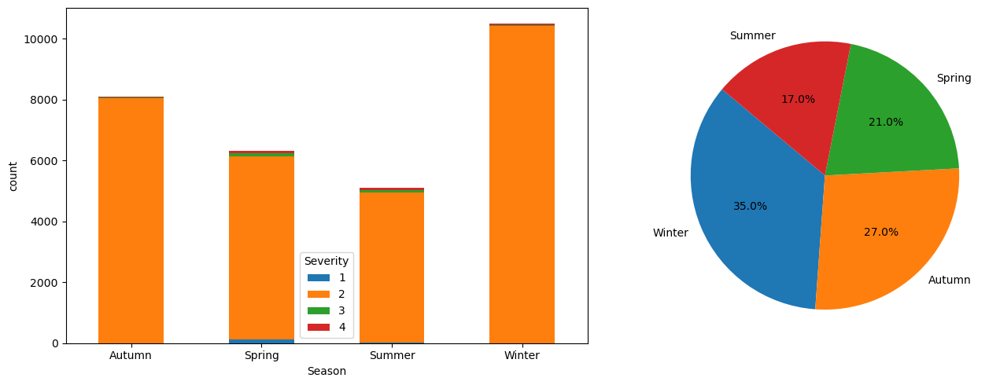

In [61]:
f, axes = plt.subplots(1, 2, figsize=(14, 5))

# stacked graph
accident_by_season.iloc[:,[1,2,3,4]].plot(kind='bar', stacked=True, ax=axes[0], ylabel='count', rot=0)

# pie chart
season_counts = season_df['Season'].value_counts()
axes[1].pie(season_counts, labels=season_counts.index, autopct='%1.1f%%', startangle=140)

plt.tight_layout()
plt.show()

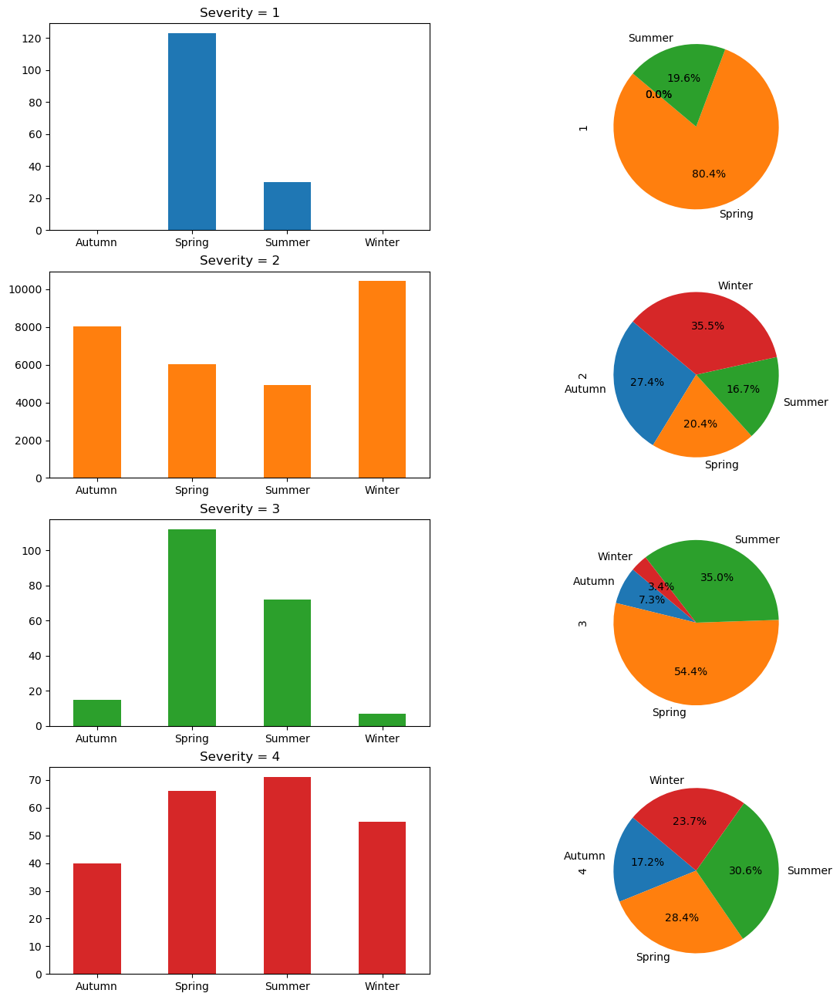

In [62]:
# plot graph based on severity
f, axes = plt.subplots(4, 2, figsize=(14, 4*4))

blue = '#1f77b4'
orange = '#ff7f0e'
green = '#2ca02c'
red = '#d62728'
colors = [blue, orange, green, red]

i = 0
for col in accident_by_season.columns:
    if col != 'Total':
        accident_by_season[col].plot(kind='bar', ax=axes[i][0], color=colors[i], rot=0, xlabel='', title=f'Severity = {i+1}')
        accident_by_season[col].plot(kind='pie', ax=axes[i][1], autopct='%1.1f%%', startangle=140)
        i += 1

## Boolean Values

Columns with boolean values in the dataset shows the presence or not of **road features**. The new addition of boolean values are just simplification of exisiting columns

In [63]:
# get boolean values
bool_cal_accident_data = pd.DataFrame(cal_accident_df.select_dtypes('bool'))
bool_cal_accident_data['Severity'] = cal_accident_df['Severity']
bool_cal_accident_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Amenity          30000 non-null  bool 
 1   Bump             30000 non-null  bool 
 2   Crossing         30000 non-null  bool 
 3   Give_Way         30000 non-null  bool 
 4   Junction         30000 non-null  bool 
 5   No_Exit          30000 non-null  bool 
 6   Railway          30000 non-null  bool 
 7   Station          30000 non-null  bool 
 8   Stop             30000 non-null  bool 
 9   Traffic_Calming  30000 non-null  bool 
 10  Traffic_Signal   30000 non-null  bool 
 11  Sunlight         30000 non-null  bool 
 12  Is_Rush_Hour     30000 non-null  bool 
 13  Is_Christmas     30000 non-null  bool 
 14  Is_Weekday       30000 non-null  bool 
 15  Severity         30000 non-null  int64
dtypes: bool(15), int64(1)
memory usage: 674.0 KB


In [64]:
for col in bool_cal_accident_data.columns:
    if col == 'Severity':
        continue
    tmp = bool_cal_accident_data.groupby([col, 'Severity']).size().unstack(fill_value=0)
    tmp.insert(0, 'Total', tmp.sum(axis=1))
    print(tmp)
    print('-'*40)

Severity  Total    1      2    3    4
Amenity                              
False     29722  153  29134  206  229
True        278    0    275    0    3
----------------------------------------
Severity  Total    1      2    3    4
Bump                                 
False     29978  153  29388  205  232
True         22    0     21    1    0
----------------------------------------
Severity  Total    1      2    3    4
Crossing                             
False     28386  135  27839  194  218
True       1614   18   1570   12   14
----------------------------------------
Severity  Total    1      2    3    4
Give_Way                             
False     29961  152  29375  205  229
True         39    1     34    1    3
----------------------------------------
Severity  Total    1      2    3    4
Junction                             
False     27259  113  26789  159  198
True       2741   40   2620   47   34
----------------------------------------
Severity  Total    1      2    3   

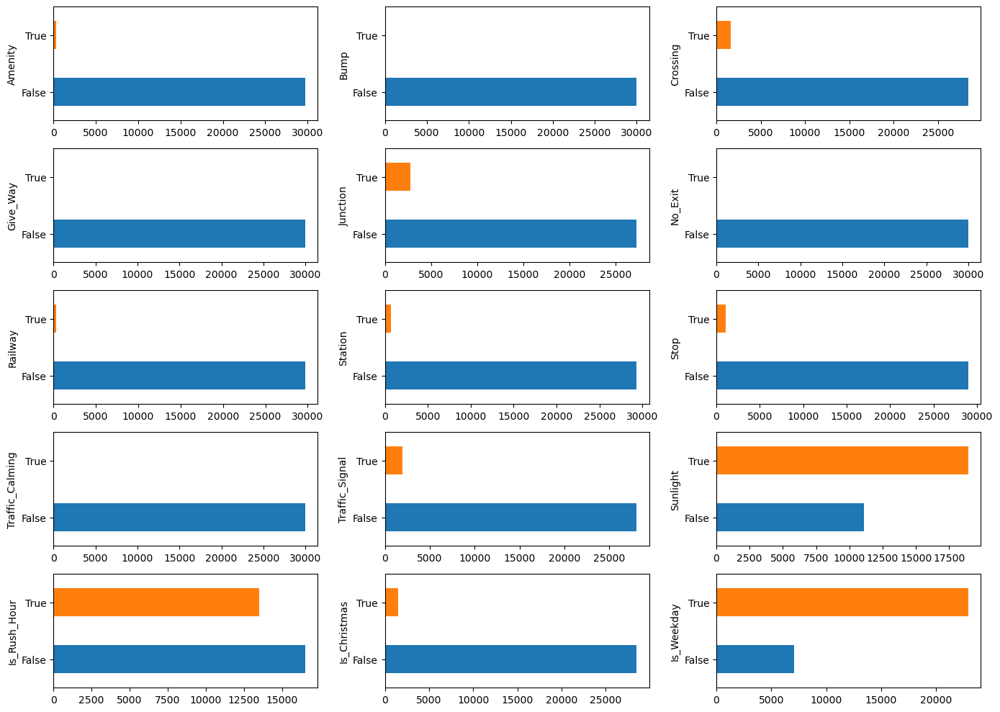

In [65]:
# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_cal_accident_data.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_cal_accident_data[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 1

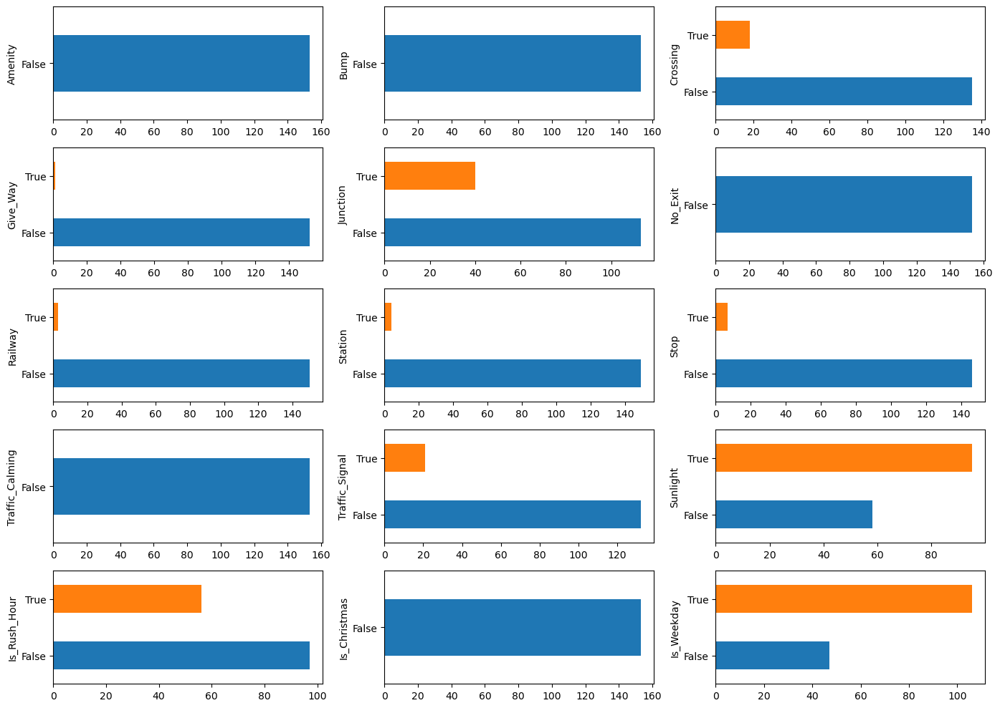

In [66]:
bool_severity_1 = bool_cal_accident_data[bool_cal_accident_data['Severity']==1]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_1.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_1[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 2

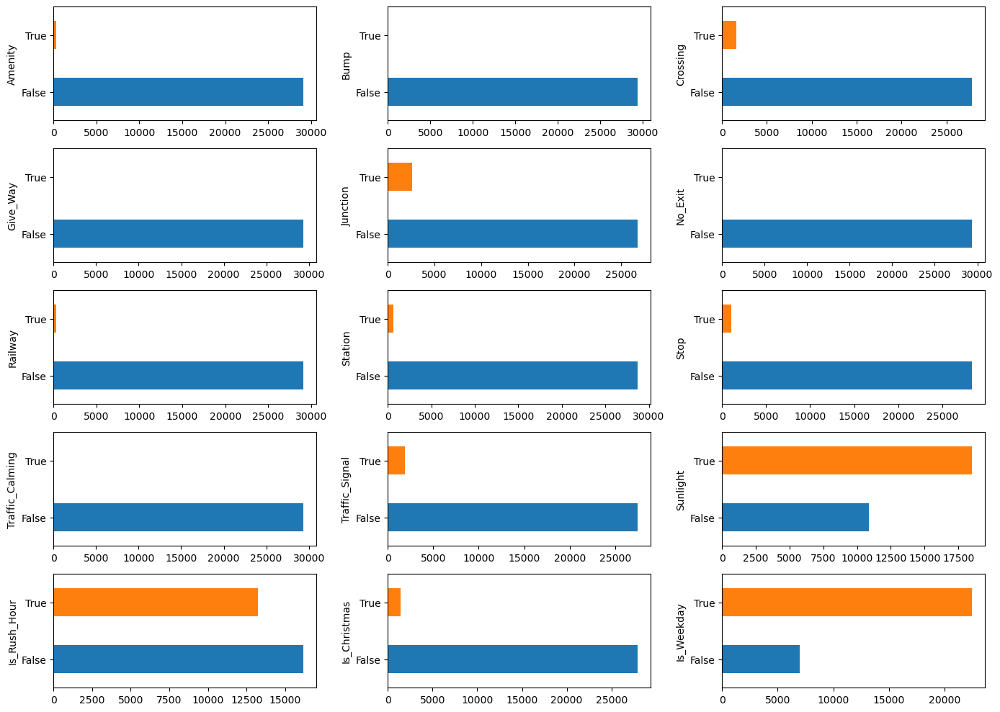

In [67]:
bool_severity_2 = bool_cal_accident_data[bool_cal_accident_data['Severity']==2]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_2.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_2[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 3

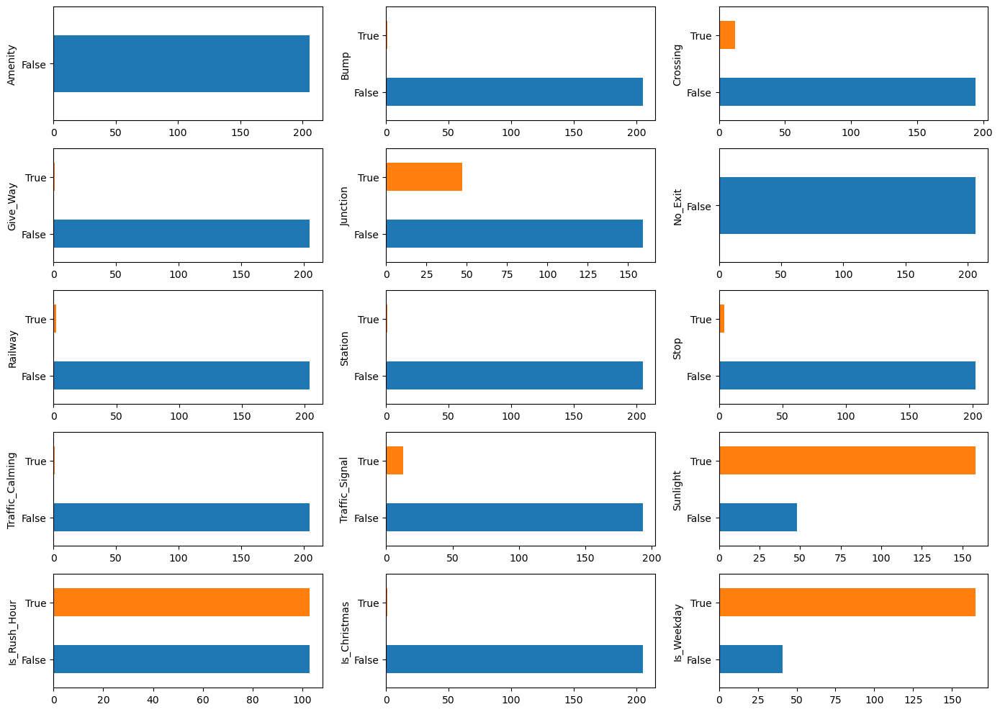

In [68]:
bool_severity_3 = bool_cal_accident_data[bool_cal_accident_data['Severity']==3]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_3.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_3[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

### Severity = 4

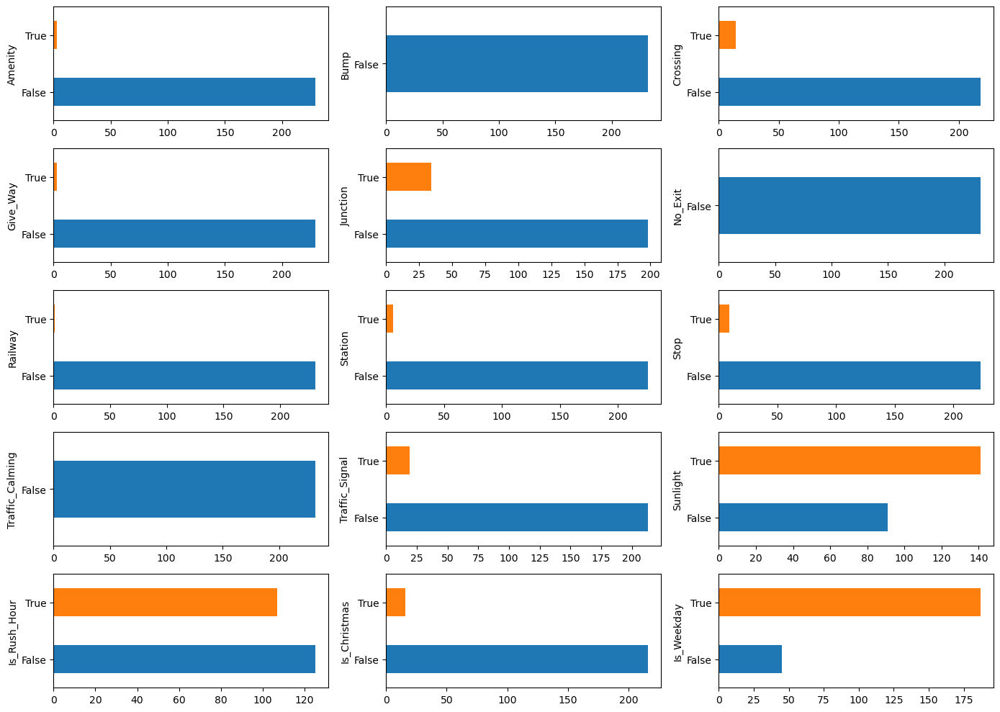

In [69]:
bool_severity_4 = bool_cal_accident_data[bool_cal_accident_data['Severity']==4]

# plot pie graph
f, axes = plt.subplots(5, 3, figsize=(14, 10))

blue = '#1f77b4'
orange = '#ff7f0e'
colors = [blue, orange]

for i, column in enumerate(bool_severity_4.columns):
    if column == 'Severity':
        continue
    ax = axes[i // 3, i % 3]  # Get the current axis
    counts = bool_severity_4[column].value_counts().sort_index()
    counts.plot(kind='barh', ax=ax, color=colors)

# Adjust layout
plt.tight_layout()
plt.show()

## Numerical Values

In [70]:
# get numeric data
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_data = pd.DataFrame(cal_accident_df.select_dtypes(include=numerics))
numeric_data = numeric_data.drop(columns=["Severity", "Start_Lat", "Start_Lng"])   # remove cols that have been analysed
numeric_data['Severity'] = cal_accident_df['Severity']
numeric_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Humidity(%)     30000 non-null  float64
 1   Wind_Direction  30000 non-null  float64
 2   Distance        30000 non-null  float64
 3   Visibility      30000 non-null  float64
 4   Wind_Speed      30000 non-null  float64
 5   Temperature     30000 non-null  float64
 6   Wind_Chill      30000 non-null  float64
 7   Precipitation   30000 non-null  float64
 8   Pressure        30000 non-null  float64
 9   Severity        30000 non-null  int64  
dtypes: float64(9), int64(1)
memory usage: 2.3 MB


In [71]:
numeric_data.describe()

,Humidity(%),Wind_Direction,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure,Severity
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,57.822400,140.589817,1.227638,14.457118,9.791829,17.234714,17.056002,0.090662,748.878884,2.017233
std,24.702719,123.498251,2.763824,4.232139,8.750097,7.888020,8.187741,0.604952,23.342678,0.206408
min,2.000000,-2.000000,0.000000,0.000000,0.000000,-17.220000,-18.890000,0.000000,491.740000,1.000000
25%,38.000000,-1.000000,0.040000,16.000000,0.000000,11.670000,11.670000,0.000000,746.250000,2.000000
50%,60.000000,157.500000,0.300000,16.000000,9.600000,16.670000,16.670000,0.000000,756.410000,2.000000
75%,78.000000,270.000000,1.290000,16.000000,14.400000,22.220000,22.220000,0.000000,760.480000,2.000000
max,100.000000,337.500000,78.950000,160.000000,227.200000,45.560000,45.560000,20.320000,775.210000,4.000000


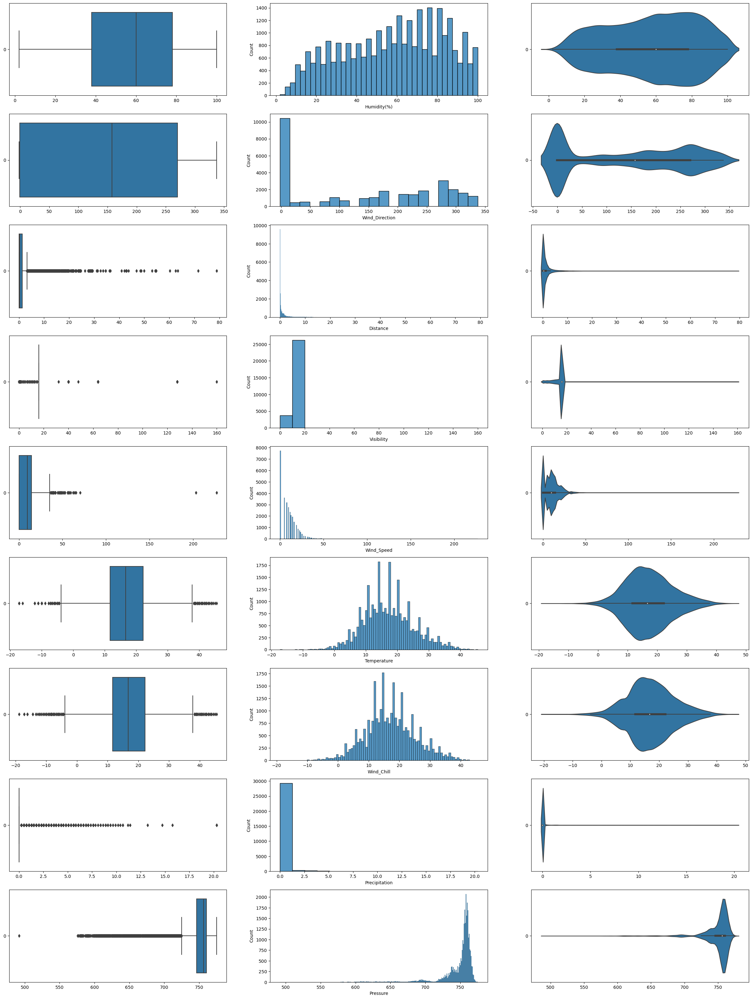

In [72]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in numeric_data.columns:
    sb.boxplot(data = numeric_data[col], orient = "h", ax = axes[count,0])
    sb.histplot(data = numeric_data[col], ax = axes[count,1])
    sb.violinplot(data = numeric_data[col], orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:   # skip 'Severity' col
        break

<Axes: >

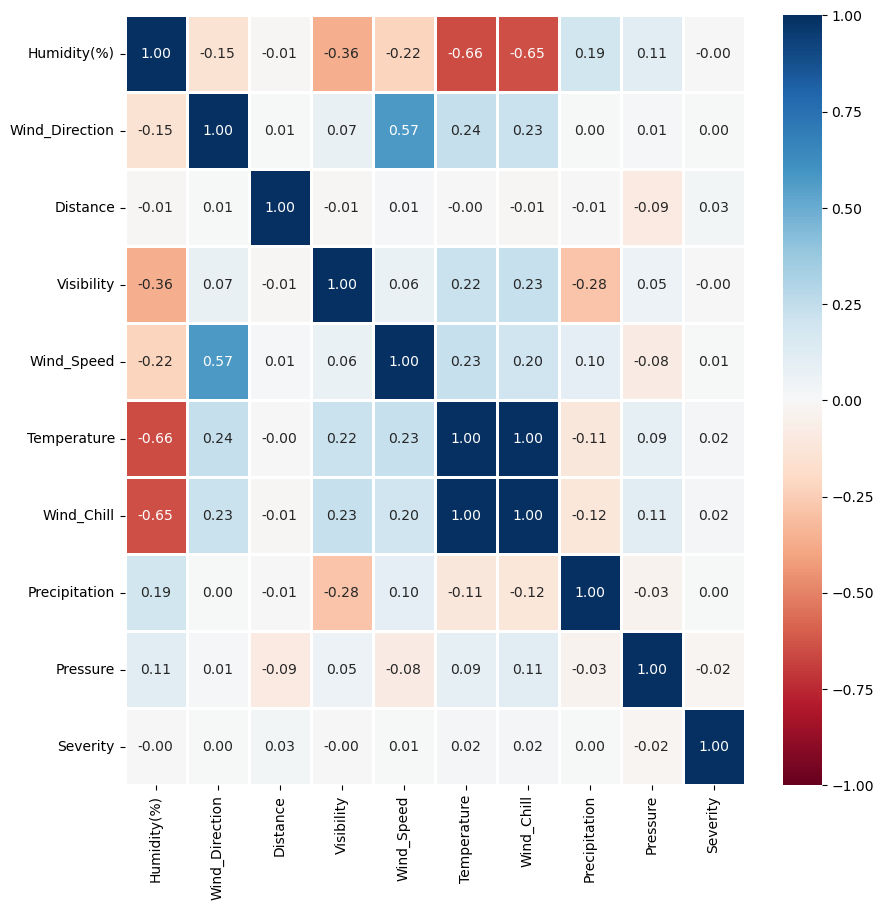

In [73]:
# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(10, 10))
sb.heatmap(numeric_data.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 10}, cmap = "RdBu")

### Severity = 1

In [74]:
num_severity_1 = numeric_data[numeric_data['Severity']==1]
num_severity_1.describe()

,Humidity(%),Wind_Direction,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure,Severity
count,153.000000,153.000000,153.00000,153.000000,153.000000,153.000000,153.000000,153.000000,153.000000,153.0
mean,61.928105,201.754902,0.02817,15.100654,12.862745,17.407712,17.346013,0.082876,757.984183,1.0
std,22.358062,112.160440,0.24264,2.877602,8.289260,7.502601,7.590339,0.483908,8.879007,0.0
min,13.000000,-2.000000,0.00000,1.600000,0.000000,2.780000,2.780000,0.000000,692.150000,1.0
25%,46.000000,157.500000,0.00000,16.000000,8.000000,12.220000,12.220000,0.000000,755.650000,1.0
50%,66.000000,247.500000,0.00000,16.000000,12.800000,15.560000,15.560000,0.000000,759.460000,1.0
75%,77.000000,292.500000,0.00000,16.000000,16.000000,21.110000,21.110000,0.000000,762.250000,1.0
max,100.000000,337.500000,2.90000,16.000000,41.600000,40.000000,40.000000,4.830000,769.870000,1.0


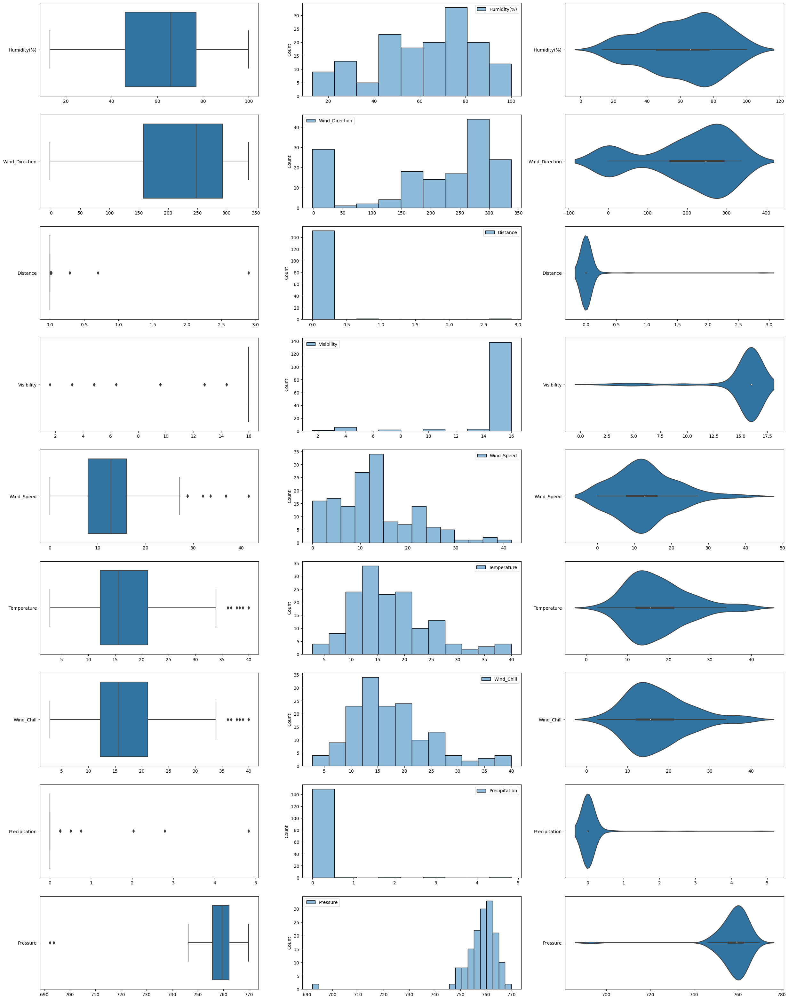

In [75]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_1.columns:
    temp_pd = pd.DataFrame(num_severity_1[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 2

In [76]:
num_severity_2 = numeric_data[numeric_data['Severity']==2]
num_severity_2.describe()

,Humidity(%),Wind_Direction,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure,Severity
count,29409.000000,29409.000000,29409.000000,29409.000000,29409.000000,29409.000000,29409.000000,29409.000000,29409.000000,29409.0
mean,57.794145,139.968734,1.231137,14.450353,9.753237,17.204701,17.024806,0.090308,748.856289,2.0
std,24.737648,123.488462,2.740818,4.238178,8.739289,7.880659,8.181710,0.604064,23.384161,0.0
min,2.000000,-2.000000,0.000000,0.000000,0.000000,-17.220000,-18.890000,0.000000,491.740000,2.0
25%,38.000000,-1.000000,0.040000,16.000000,0.000000,11.670000,11.670000,0.000000,746.250000,2.0
50%,60.000000,157.500000,0.310000,16.000000,9.600000,16.670000,16.670000,0.000000,756.410000,2.0
75%,78.000000,270.000000,1.300000,16.000000,14.400000,22.220000,22.220000,0.000000,760.480000,2.0
max,100.000000,337.500000,78.950000,160.000000,227.200000,45.560000,45.560000,20.320000,775.210000,2.0


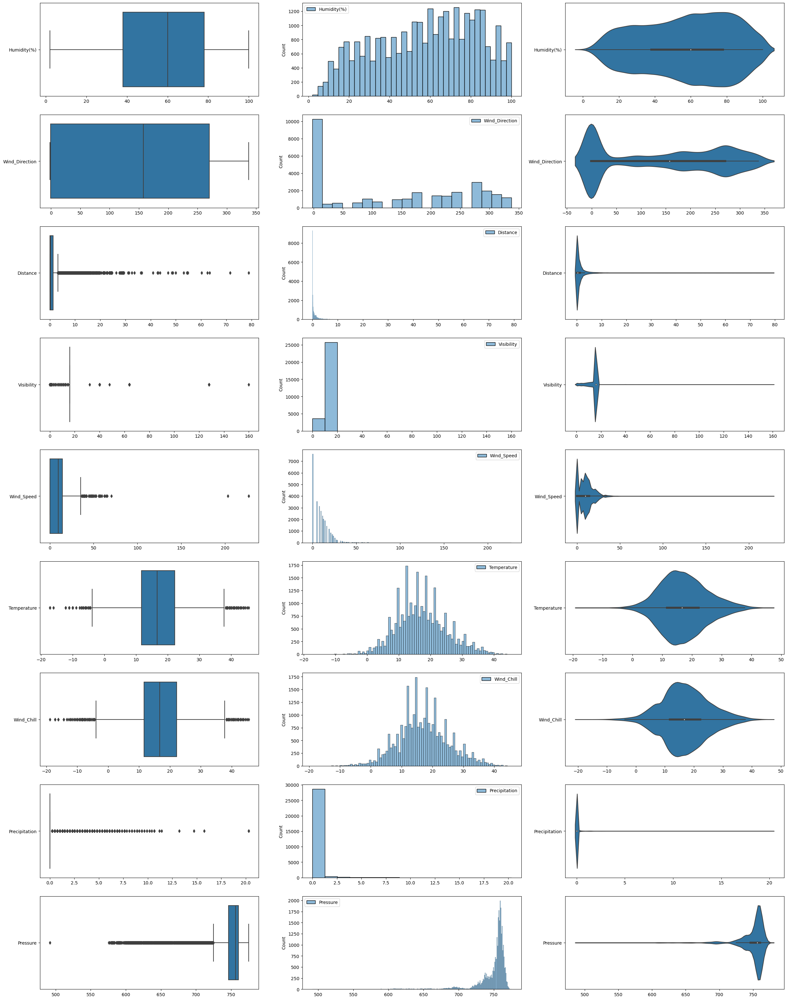

In [77]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_2.columns:
    temp_pd = pd.DataFrame(num_severity_2[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 3

In [78]:
num_severity_3 = numeric_data[numeric_data['Severity']==3]
num_severity_3.describe()

,Humidity(%),Wind_Direction,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure,Severity
count,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.000000,206.0
mean,58.184466,168.087379,0.763252,15.122330,12.275728,20.749854,20.721553,0.150437,750.683495,3.0
std,21.260176,119.736315,1.946928,2.476226,9.478998,7.101904,7.160793,0.867228,12.349382,0.0
min,9.000000,-2.000000,0.000000,1.600000,0.000000,5.560000,3.330000,0.000000,684.530000,3.0
25%,44.000000,-1.000000,0.000000,16.000000,4.800000,15.560000,15.560000,0.000000,741.552500,3.0
50%,61.000000,202.500000,0.155000,16.000000,11.200000,19.720000,19.720000,0.000000,756.160000,3.0
75%,75.000000,270.000000,0.797500,16.000000,19.200000,24.860000,24.860000,0.000000,758.700000,3.0
max,96.000000,337.500000,19.700000,16.000000,48.000000,40.000000,40.000000,9.140000,769.620000,3.0


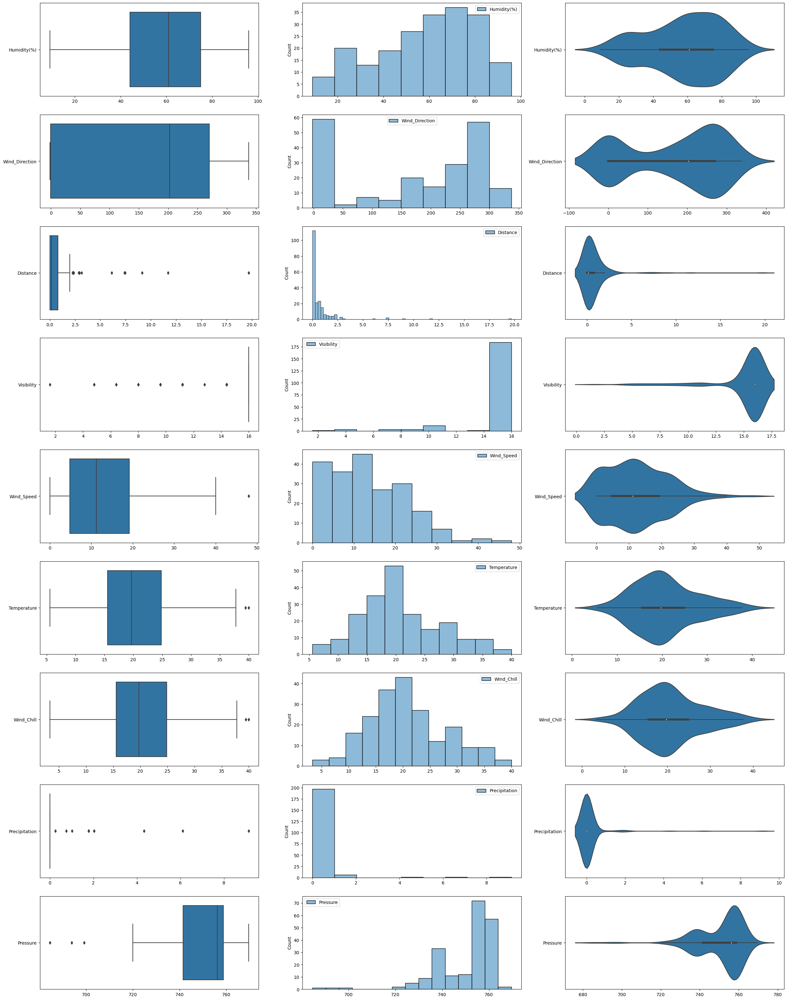

In [79]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_3.columns:
    temp_pd = pd.DataFrame(num_severity_3[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

### Severity = 4

In [80]:
num_severity_4 = numeric_data[numeric_data['Severity']==4]
num_severity_4.describe()

,Humidity(%),Wind_Direction,Distance,Visibility,Wind_Speed,Temperature,Wind_Chill,Precipitation,Pressure,Severity
count,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.000000,232.0
mean,58.375000,154.566810,1.987457,14.299655,10.453103,17.804009,17.564569,0.087543,744.136034,4.0
std,24.487507,122.189774,5.525978,5.265156,9.089536,8.982631,9.393998,0.498275,29.657814,0.0
min,6.000000,-2.000000,0.000000,0.000000,0.000000,-3.330000,-11.670000,0.000000,610.360000,4.0
25%,39.500000,-1.000000,0.070000,16.000000,4.800000,12.082500,12.082500,0.000000,746.445000,4.0
50%,58.500000,180.000000,0.405000,16.000000,9.600000,17.220000,17.220000,0.000000,754.380000,4.0
75%,80.000000,270.000000,1.195000,16.000000,16.000000,24.027500,24.027500,0.000000,758.950000,4.0
max,100.000000,337.500000,42.080000,64.000000,44.800000,37.780000,37.780000,6.100000,768.860000,4.0


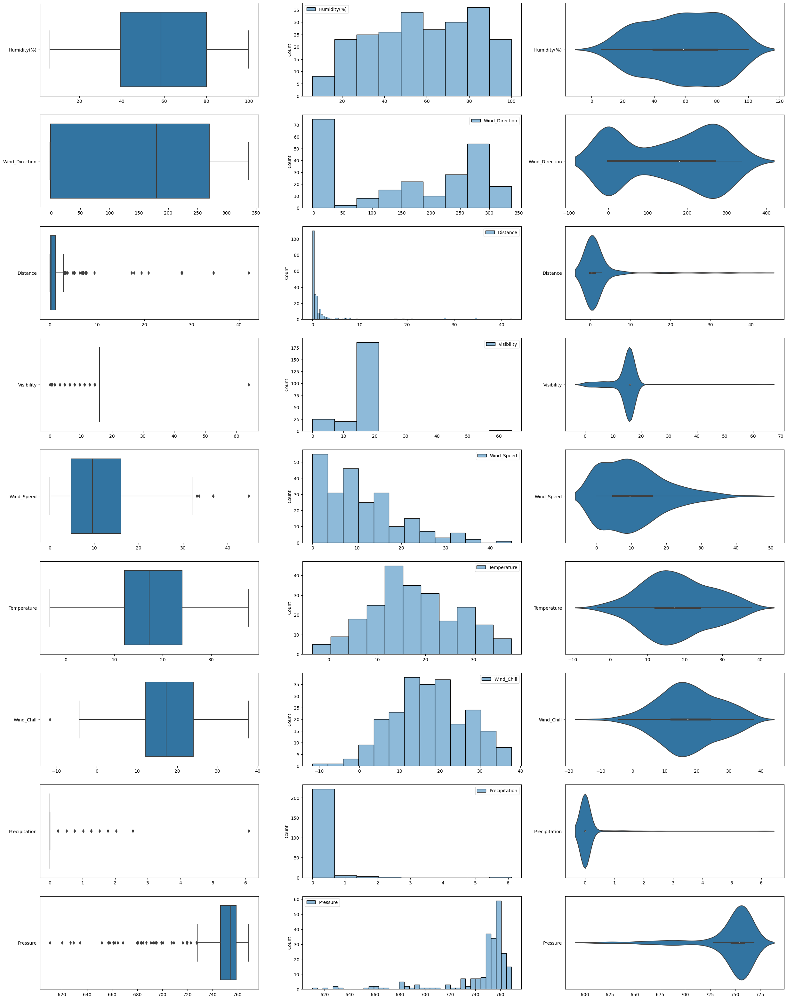

In [81]:
# plot graph
f, axes = plt.subplots(9, 3, figsize=(30, 40))

count = 0
for col in num_severity_4.columns:
    temp_pd = pd.DataFrame(num_severity_4[col])
    sb.boxplot(data = temp_pd, orient = "h", ax = axes[count,0])
    sb.histplot(data = temp_pd, ax = axes[count,1])
    sb.violinplot(data = temp_pd, orient = "h", ax = axes[count,2])
    count += 1
    if count == 9:
        break

we can see that most accidents occur in normal weather condition. This shows that drivers may be driving less carefully in good weather conditions as compared to poor weather conditions. This may be due to complacency of drivers when driving in good weather where there are not focusing as much. 

---
# Cleaning for Machine Learning

While we have cleaned our data earlier, we have added new columns and group some our data. Thus, we need to remove unnecessary columns. We also need to change all columns with `object` type to a numerical type so that it will be easier when doing classification later on

In [82]:
# let us first make a copy of our dataframe
ml_df = cal_accident_df.copy()

The `Start_Time` column can be further broken down into its individual component like `Month` and `Hour`. This will make it easier when doing machine learning later on

In [83]:
ml_df['Year'] = cal_accident_df['Start_Time'].dt.year
ml_df['Month'] = cal_accident_df['Start_Time'].dt.month
ml_df['Day'] = cal_accident_df['Start_Time'].dt.day
ml_df['Day_Week'] = cal_accident_df['Start_Time'].dt.weekday

ml_df['Hour'] = cal_accident_df['Start_Time'].dt.hour
ml_df['Minute'] = cal_accident_df['Start_Time'].dt.minute

Now, we remove unnecessary columns

In [84]:
# remove columns
remove_cols = ['Start_Time', 'Street', 'Sunrise_Sunset', 'Weather_Condition']
ml_df = ml_df.drop(columns=remove_cols)

Let us take a look at our updated dataframe

In [85]:
ml_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 39 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Severity         30000 non-null  int64  
 1   Start_Lat        30000 non-null  float64
 2   Start_Lng        30000 non-null  float64
 3   City             30000 non-null  object 
 4   County           30000 non-null  object 
 5   Zipcode          30000 non-null  object 
 6   Humidity(%)      30000 non-null  float64
 7   Wind_Direction   30000 non-null  float64
 8   Amenity          30000 non-null  bool   
 9   Bump             30000 non-null  bool   
 10  Crossing         30000 non-null  bool   
 11  Give_Way         30000 non-null  bool   
 12  Junction         30000 non-null  bool   
 13  No_Exit          30000 non-null  bool   
 14  Railway          30000 non-null  bool   
 15  Station          30000 non-null  bool   
 16  Stop             30000 non-null  bool   
 17  Traffic_Calm

Now, let us convert all the column with `object` type into numerical type using `sklearn LabelEncoder`  
https://scikit-learn.org/dev/modules/generated/sklearn.preprocessing.LabelEncoder.html   
https://stackoverflow.com/questions/44474570/sklearn-label-encoding-multiple-columns-pandas-dataframe

In [86]:
# get column of object type
object_col = ml_df.select_dtypes(object).columns
print(object_col)

Index(['City', 'County', 'Zipcode', 'Weather', 'Road_Type', 'Season'], dtype='object')


In [87]:
#Label Encoding for object to numeric conversion
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for col in object_col:
    ml_df[col] = le.fit_transform(ml_df[col].astype(str))

In [88]:
bool_col = ml_df.select_dtypes(bool).columns
for col in bool_col:
    ml_df[col] = ml_df[col].astype(int)

In [89]:
ml_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 39 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Severity         30000 non-null  int64  
 1   Start_Lat        30000 non-null  float64
 2   Start_Lng        30000 non-null  float64
 3   City             30000 non-null  int32  
 4   County           30000 non-null  int32  
 5   Zipcode          30000 non-null  int32  
 6   Humidity(%)      30000 non-null  float64
 7   Wind_Direction   30000 non-null  float64
 8   Amenity          30000 non-null  int32  
 9   Bump             30000 non-null  int32  
 10  Crossing         30000 non-null  int32  
 11  Give_Way         30000 non-null  int32  
 12  Junction         30000 non-null  int32  
 13  No_Exit          30000 non-null  int32  
 14  Railway          30000 non-null  int32  
 15  Station          30000 non-null  int32  
 16  Stop             30000 non-null  int32  
 17  Traffic_Calm

---
# Resampling

As seen from our above analysis, `Severity = 2` is causing an imbalanced data with more than 95 % of our data being `Severity = 2`. This would cause a high accuracy from all our classification method later on as it will be skewed towards `Severity = 2`.

Hence, we need to use resampling in order to even out the ratio between the different `Severity`

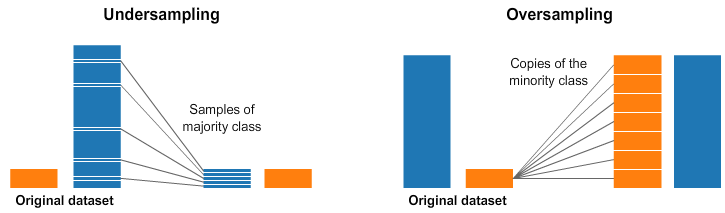

In [99]:
from sklearn.model_selection import train_test_split

predictors = [ele for ele in ml_df.columns if ele != 'Severity']
# print(predictors)

y = pd.DataFrame(ml_df['Severity'])
X = pd.DataFrame(ml_df[predictors])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 20)

In [100]:
print(y_train.value_counts().sort_index())

Severity
1             125
2           23525
3             161
4             189
Name: count, dtype: int64


In [101]:
from imblearn.combine import SMOTETomek
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [107]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=20)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [112]:
X_res.shape

(94100, 38)

In [116]:
y_res.value_counts()

Severity
1           23525
2           23525
3           23525
4           23525
Name: count, dtype: int64

In [117]:
sme = SMOTEENN(random_state=20)
X_res, y_res = sme.fit_resample(X_train, y_train)

In [118]:
X_res.shape

(89082, 38)

In [120]:
y_res.value_counts().sort_index()

Severity
1           23524
2           18513
3           23524
4           23521
Name: count, dtype: int64

In [121]:
smt = SMOTETomek(random_state=20)
X_res, y_res = smt.fit_resample(X_train, y_train)

In [122]:
X_res.shape

(94100, 38)

In [123]:
y_res.value_counts().sort_index()

Severity
1           23525
2           23525
3           23525
4           23525
Name: count, dtype: int64

---
# Machine Learning

Now that we have done our EDA, we can move on to machine learning where we will try to predict `Severity` based on the other factors that are provided.

First, we need to split our data to `test` and `train` dataset

In [2]:
# from sklearn.model_selection import train_test_split

predictors = [ele for ele in ml_df.columns if ele != 'Severity']
# print(predictors)

y = pd.DataFrame(ml_df['Severity'])
X = pd.DataFrame(ml_df[predictors])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

NameError: name 'ml_df' is not defined

## Decision Tree Classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dectree = DecisionTreeClassifier()  # create the decision tree object
dectree.fit(X_train, y_train)

In [ ]:
# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

labels = ['1', '2', '3', '4']
axes[0].set_title('Train')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True'); 
axes[0].xaxis.set_ticklabels(labels); 
axes[0].yaxis.set_ticklabels(labels);

axes[1].set_title('Test')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True'); 
axes[1].xaxis.set_ticklabels(labels); 
axes[1].yaxis.set_ticklabels(labels);

In [ ]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree

f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=predictors, 
          class_names=labels)

## Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict Response corresponding to Predictors
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rf.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rf.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

labels = ['1', '2', '3', '4']
axes[0].set_title('Train')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True'); 
axes[0].xaxis.set_ticklabels(labels); 
axes[0].yaxis.set_ticklabels(labels);

axes[1].set_title('Test')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True'); 
axes[1].xaxis.set_ticklabels(labels); 
axes[1].yaxis.set_ticklabels(labels);

## Linear Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression()
log_model.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict Response corresponding to Predictors
y_train_pred = log_model.predict(X_train)
y_test_pred = log_model.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", log_model.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", log_model.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

labels = ['1', '2', '3', '4']
axes[0].set_title('Train')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True'); 
axes[0].xaxis.set_ticklabels(labels); 
axes[0].yaxis.set_ticklabels(labels);

axes[1].set_title('Test')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True'); 
axes[1].xaxis.set_ticklabels(labels); 
axes[1].yaxis.set_ticklabels(labels);

## Naive Bayes Gaussian Classifier

In [ ]:
from sklearn.naive_bayes import GaussianNB

nbgauss = GaussianNB()
nbgauss.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict Response corresponding to Predictors
y_train_pred = nbgauss.predict(X_train)
y_test_pred = nbgauss.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", nbgauss.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", nbgauss.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

labels = ['1', '2', '3', '4']
axes[0].set_title('Train')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True'); 
axes[0].xaxis.set_ticklabels(labels); 
axes[0].yaxis.set_ticklabels(labels);

axes[1].set_title('Test')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True'); 
axes[1].xaxis.set_ticklabels(labels); 
axes[1].yaxis.set_ticklabels(labels);

## Support Vector Machines (SVM)

In [ ]:
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel
clf.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict Response corresponding to Predictors
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", clf.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", clf.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

labels = ['1', '2', '3', '4']
axes[0].set_title('Train')
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True'); 
axes[0].xaxis.set_ticklabels(labels); 
axes[0].yaxis.set_ticklabels(labels);

axes[1].set_title('Test')
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True'); 
axes[1].xaxis.set_ticklabels(labels); 
axes[1].yaxis.set_ticklabels(labels);